# Perch V2 — Zero-Shot vs Trained Classifier Evaluation

### Data format expected
- **WAV folder**: flat folder of `.wav` files named like `SCW1807_20200711_082500.wav`
- **Annotation JSON**: single JSON file mapping `SCW1807_20200711_082500-contours.json` → list of `{start, end, label}` dicts

### What this notebook does

1. Extracts **fixed 5s windows** and associates the corresponding labels
2. Embeds all windows with **Perch V2**
3. Evaluates **zero-shot** performance using Perch V2's built-in logits
4. Trains a **linear classifier** on top of the embeddings
5. Reports **per-class precision / recall / F1** for both, with plots
6. Performs **Dimensinality Reduction** to asses class separation in 2D and cluster formation.


> **Requirements**: GPU runtime + perch-hoplite installed (cells below)

In order to use Perch V2, you must install this version (or later) of TensorFlow and cuda

In [ ]:
%pip install tensorflow[and-cuda]~=2.20.0rc0

Choose the working gpu

In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0"

In [2]:
import tensorflow as tf
import torch

print(f"TF GPUs: {tf.config.list_physical_devices('GPU')}")
print(f"PyTorch: {torch.cuda.get_device_name(0) if torch.cuda.is_available() else 'CPU'}")
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    # Only use GPU 0
    tf.config.set_visible_devices(gpus[0], 'GPU')
    # Optional: prevent TF from grabbing all memory
    tf.config.experimental.set_memory_growth(gpus[0], True)
print(f"TF using: {tf.config.get_visible_devices('GPU')}")

2026-05-07 09:40:57.733273: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-05-07 09:40:57.818934: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2026-05-07 09:40:59.392938: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.


TF GPUs: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
PyTorch: NVIDIA L4
TF using: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [3]:
#@title Imports
import json
import warnings
from pathlib import Path
import os
import librosa
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    classification_report
)
import librosa.display
import soxr
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import LabelEncoder, StandardScaler
from perch_hoplite.zoo import model_configs

In [4]:
#@title Configuration { vertical-output: true }

#@markdown Folder containing all .wav files
wav_folder = '/data2/mromaniuc/cet-det/datasets/DCLDE_2026/audio'  #@param {type:'string'}

#@markdown Folder for base saving
save_dir = '/data2/mromaniuc/cet-det/models/perch_v2/DCLDE_2026'

#@markdown Path to your single annotation JSON file
annotation_json_path = '/data2/mromaniuc/cet-det/datasets/DCLDE_2026/Annotations_clean.csv'  #@param {type:'string'}

#@markdown Window size in seconds fed to Perch V2 (default 5.0)
window_size_s = 5.0  #@param {type:'number'}

#@markdown Minimum overlap (s) between an annotation and a window to label it as positive
min_overlap_s = 0.001  #@param {type:'number'}

#@markdown Fraction of data held out for testing
test_size = 0.3  #@param {type:'number'}

#@markdown Random seed
random_seed = 123  #@param {type:'number'}

In [5]:
#@title Load Perch V2 model
model_key = 'perch_v2'
embedding_model = model_configs.load_model_by_name(model_key)
sr = embedding_model.sample_rate

perch_class_names = list(embedding_model.class_list['labels'].classes)
print(f'Model loaded. Sample rate: {sr} Hz')
print(f'Perch V2 built-in classes: {len(perch_class_names)}')

I0000 00:00:1778139667.487421 2681943 gpu_device.cc:2020] Created device /device:GPU:0 with 20749 MB memory:  -> device: 0, name: NVIDIA L4, pci bus id: 0000:3b:00.0, compute capability: 8.9
I0000 00:00:1778139667.886914 2681943 gpu_device.cc:2020] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 20749 MB memory:  -> device: 0, name: NVIDIA L4, pci bus id: 0000:3b:00.0, compute capability: 8.9


Model loaded. Sample rate: 32000 Hz
Perch V2 built-in classes: 14795


In [8]:
#@title Build windows from DCLDE 2027 annotations

import json
import soundfile as sf
from pathlib import Path
from collections import defaultdict
from tqdm.notebook import tqdm

# ── CONFIG ────────────────────────────────────────────────────────────────────

ANNOTATIONS_CSV = annotation_json_path
AUDIO_ROOT      = Path(wav_folder)
OUTPUT_JSON     = "./windows.json"

WINDOW_SIZE_S   = 5.0
MIN_OVERLAP_S   = 0.001

# ── Load & map columns ────────────────────────────────────────────────────────

df_annot = pd.read_csv(ANNOTATIONS_CSV, index_col=0)

start_col = "FileBeginSec"
end_col   = "FileEndSec"
file_col  = "Soundfile"
label_col = "ClassSpecies"

print(f"  file={file_col}  start={start_col}  end={end_col}  label={label_col}")

# ── Group annotations by soundfile ───────────────────────────────────────────

file_annots = defaultdict(list)
for _, row in df_annot.iterrows():
    file_annots[row[file_col]].append({
        "start":    float(row[start_col]),
        "end":      float(row[end_col]),
        "label":    row[label_col],
        "provider": row.get("Provider", ""),
        "dataset":  row.get("Dataset", ""),
        "ecotype":  str(row.get("Ecotype", "")),
    })

# ── Index wavs on disk ────────────────────────────────────────────────────────

wav_index = {f.name: f for f in AUDIO_ROOT.rglob("*.wav")}
print(f"  {len(wav_index):,} wav files on disk, {len(file_annots):,} annotated files")

# ── Build windows ─────────────────────────────────────────────────────────────

windows      = []
missing_wavs = []

for soundfile, annotations in tqdm(file_annots.items(), desc="windowing"):
    wav_path = wav_index.get(soundfile)
    if wav_path is None:
        missing_wavs.append(soundfile)
        continue

    try:
        duration = sf.info(str(wav_path)).duration
    except Exception:
        continue

    n_windows = int(duration // WINDOW_SIZE_S)
    provider  = annotations[0]["provider"]
    dataset   = annotations[0]["dataset"]

    for i in range(n_windows):
        win_start = i * WINDOW_SIZE_S
        win_end   = win_start + WINDOW_SIZE_S

        labels        = set()
        label_counts  = defaultdict(int)
        ecotypes_seen = set()

        for ann in annotations:
            overlap = min(win_end, ann["end"]) - max(win_start, ann["start"])
            if overlap >= MIN_OVERLAP_S:
                labels.add(ann["label"])
                label_counts[ann["label"]] += 1
                if ann["ecotype"]:
                    ecotypes_seen.add(ann["ecotype"])

        labels = sorted(labels) if labels else ["background"]

        windows.append({
            "wav_path":     str(wav_path),
            "soundfile":    soundfile,
            "offset_s":     win_start,
            "duration_s":   WINDOW_SIZE_S,
            "labels":       labels,
            "label_str":    "+".join(labels),
            "provider":     provider,
            "dataset":      dataset,
            "label_counts": dict(label_counts),
            "ecotypes":     sorted(ecotypes_seen),
        })

windows_df = pd.DataFrame(windows)

# ── Stats ─────────────────────────────────────────────────────────────────────

print(f"\nTotal windows    : {len(windows_df):,}")
print(f"Missing wavs     : {len(missing_wavs):,}")
print(f"\nLabel distribution:")
print(windows_df["label_str"].value_counts().to_string())
print(f"\nPer provider:")
print(windows_df.groupby(["provider", "label_str"]).size().to_string())

# ── Save ──────────────────────────────────────────────────────────────────────

with open(OUTPUT_JSON, "w") as f:
    json.dump({
        "config":  {"window_size_s": WINDOW_SIZE_S, "min_overlap_s": MIN_OVERLAP_S},
        "stats":   {"n_windows": len(windows_df), "label_counts": windows_df["label_str"].value_counts().to_dict()},
        "missing": missing_wavs,
        "windows": windows,
    }, f, indent=2)

print(f"\nSaved -> {OUTPUT_JSON}  ({Path(OUTPUT_JSON).stat().st_size / 1e6:.1f} MB)")

  file=Soundfile  start=FileBeginSec  end=FileEndSec  label=ClassSpecies
  1,971 wav files on disk, 1,952 annotated files


windowing:   0%|          | 0/1952 [00:00<?, ?it/s]


Total windows    : 174,538
Missing wavs     : 0

Label distribution:
label_str
background    150725
KW             21584
AB              2117
AB+KW            112

Per provider:
provider        label_str 
DFO_WDLP        AB              635
                AB+KW            20
                KW             5162
                background    28165
JASCO_VFPA      AB             1141
                AB+KW            23
                KW             9751
                background    93458
JASCO_VFPA_ONC  AB              117
                AB+KW            10
                KW             1161
                background     1172
ONC             KW              823
                background     6377
OrcaSound       AB                3
                AB+KW            13
                KW              640
                background     5511
SIO             AB               96
                AB+KW            13
                KW             3225
                background    15390
SM

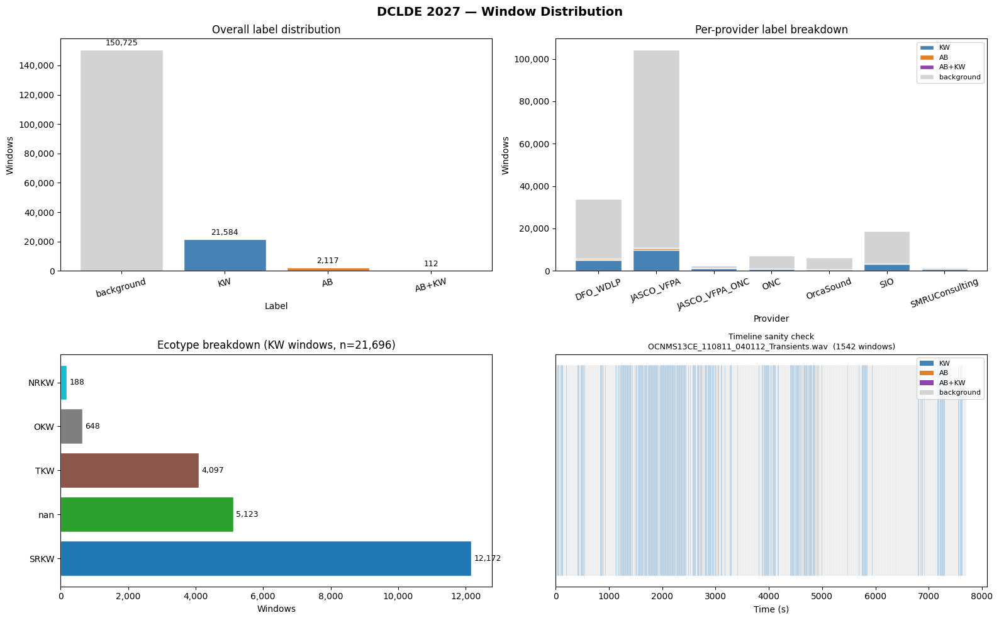

Saved -> /data2/mromaniuc/cet-det/models/perch_v2/DCLDE_2026/figures/window_distribution.png


In [8]:
#@title Visualize window distribution — DCLDE 2027

import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import numpy as np

fig, axes = plt.subplots(2, 2, figsize=(16, 10))
fig.suptitle("DCLDE 2027 — Window Distribution", fontsize=14, fontweight="bold")

label_colors = {
    "KW":         "#4682b4",
    "AB":         "#e67e22",
    "AB+KW":      "#8e44ad",
    "background": "#d3d3d3",
}

# ── 1. Overall label distribution ─────────────────────────────────────────────
ax = axes[0, 0]
vc = windows_df["label_str"].value_counts()
colors = [label_colors.get(l, "#888") for l in vc.index]
bars = ax.bar(vc.index, vc.values, color=colors, edgecolor="white")
ax.bar_label(bars, fmt=lambda x: f"{int(x):,}", fontsize=9, padding=3)
ax.set_title("Overall label distribution")
ax.set_ylabel("Windows")
ax.set_xlabel("Label")
ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f"{int(x):,}"))
ax.tick_params(axis="x", rotation=15)

# ── 2. Per-provider stacked bar ───────────────────────────────────────────────
ax = axes[0, 1]
label_order = ["KW", "AB", "AB+KW", "background"]
pivot = (
    windows_df.groupby(["provider", "label_str"])
    .size()
    .unstack(fill_value=0)
    .reindex(columns=label_order, fill_value=0)
)
bottom = np.zeros(len(pivot))
for label in label_order:
    vals = pivot[label].values
    bars = ax.bar(pivot.index, vals, bottom=bottom,
                  color=label_colors[label], label=label, edgecolor="white")
    bottom += vals

ax.set_title("Per-provider label breakdown")
ax.set_ylabel("Windows")
ax.set_xlabel("Provider")
ax.tick_params(axis="x", rotation=20)
ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f"{int(x):,}"))
ax.legend(fontsize=8, loc="upper right")

# ── 3. Ecotype breakdown (KW windows only) ────────────────────────────────────
ax = axes[1, 0]
kw_windows = windows_df[windows_df["label_str"].isin(["KW", "AB+KW"])]
# Explode ecotypes list
ecotype_counts = (
    kw_windows["ecotypes"]
    .explode()
    .replace("", "Unknown")
    .fillna("Unknown")
    .value_counts()
)
colors_eco = plt.cm.tab10(np.linspace(0, 1, len(ecotype_counts)))
bars = ax.barh(ecotype_counts.index, ecotype_counts.values,
               color=colors_eco, edgecolor="white")
ax.bar_label(bars, fmt=lambda x: f"{int(x):,}", fontsize=9, padding=3)
ax.set_title(f"Ecotype breakdown (KW windows, n={len(kw_windows):,})")
ax.set_xlabel("Windows")
ax.xaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f"{int(x):,}"))

# ── 4. Single file timeline (sanity check) ────────────────────────────────────
ax = axes[1, 1]
# Pick the file with the most KW annotations as the example
example_file = (
    windows_df[windows_df["label_str"] == "KW"]
    .groupby("wav_path")
    .size()
    .idxmax()
)
file_df = windows_df[windows_df["wav_path"] == example_file].copy()

for _, row in file_df.iterrows():
    color = label_colors.get(row["label_str"], "#888")
    ax.barh(0, WINDOW_SIZE_S, left=row["offset_s"],
            height=0.5, color=color, edgecolor="white", linewidth=0.3)

ax.set_title(
    f"Timeline sanity check\n{Path(example_file).name}  "
    f"({len(file_df)} windows)",
    fontsize=9
)
ax.set_xlabel("Time (s)")
ax.set_yticks([])
from matplotlib.patches import Patch
ax.legend(
    handles=[Patch(facecolor=v, label=k) for k, v in label_colors.items()],
    fontsize=8, loc="upper right"
)

plt.tight_layout()
os.makedirs(f"{save_dir}/figures", exist_ok=True)
plt.savefig(f"{save_dir}/figures/window_distribution.png", dpi=120, bbox_inches="tight")
plt.show()
print(f"Saved -> {save_dir}/figures/window_distribution.png")

In [6]:
#@title Compute embeddings — batched GPU inference

import soxr
import numpy as np
from tqdm.notebook import tqdm
from pathlib import Path

BATCH_SIZE   = 32      # increase to 64 if GPU memory allows
SAVE_EVERY   = 5000    # checkpoint to disk every N windows
CHECKPOINT   = f"{save_dir}/embeddings_checkpoint.npz"

target_len   = int(WINDOW_SIZE_S * sr)

def load_audio(row):
    """Load + resample one window. Returns float32 array of target_len samples."""
    audio, nat_sr = librosa.load(
        row["wav_path"], sr=None,
        offset=row["offset_s"], duration=WINDOW_SIZE_S, mono=True
    )
    audio = soxr.resample(audio, nat_sr, sr)
    if len(audio) < target_len:
        audio = np.pad(audio, (0, target_len - len(audio)))
    return audio[:target_len].astype(np.float32)

# ── Resume from checkpoint if exists ─────────────────────────────────────────
start_idx = 0
embeddings_list, logits_list, labels_list, failed_idx = [], [], [], []

if Path(CHECKPOINT).exists():
    ckpt = np.load(CHECKPOINT, allow_pickle=True)
    embeddings_list = list(ckpt["embeddings"])
    logits_list     = list(ckpt["logits"])
    labels_list     = list(ckpt["labels"])
    failed_idx      = list(ckpt["failed_idx"])
    start_idx       = int(ckpt["next_idx"])
    print(f"  Resumed from checkpoint: {start_idx} windows already done")

# ── Batched embedding loop ────────────────────────────────────────────────────
windows_df = windows_df.reset_index(drop=True)
remaining  = windows_df.iloc[start_idx:]

pbar = tqdm(total=len(remaining), desc="embedding", unit="win")

i = start_idx
batch_rows  = []
batch_audio = []

def flush_batch(batch_rows, batch_audio):
    try:
        audio_np = np.stack(batch_audio)
        out      = embedding_model.embed(audio_np)
        
        # Handle both (B, 1536) and (B, 1, 1536) output shapes
        embs = out.embeddings
        if embs.ndim == 3:
            embs = embs[:, 0, :]   # (B, 1, 1536) -> (B, 1536)
        
        logs = out.logits["label"]
        if logs.ndim == 3:
            logs = logs[:, 0, :]   # same for logits
            
        for j, row in enumerate(batch_rows):
            embeddings_list.append(embs[j])
            logits_list.append(logs[j])
            labels_list.append(row["label_str"])
    except Exception as e:
        for row in batch_rows:
            failed_idx.append(row.name)
        print(f"\n  Batch FAILED: {repr(e)}")
        

for _, row in remaining.iterrows():
    try:
        audio = load_audio(row)
        batch_rows.append(row)
        batch_audio.append(audio)
    except Exception as e:
        failed_idx.append(row.name)
        pbar.update(1)
        continue

    if len(batch_rows) == BATCH_SIZE:
        flush_batch(batch_rows, batch_audio)
        batch_rows, batch_audio = [], []
        pbar.update(BATCH_SIZE)
        i += BATCH_SIZE

        # Checkpoint
        if i % SAVE_EVERY < BATCH_SIZE:
            np.savez(CHECKPOINT,
                     embeddings = np.stack(embeddings_list),
                     logits     = np.stack(logits_list),
                     labels     = np.array(labels_list),
                     failed_idx = np.array(failed_idx),
                     next_idx   = i)
            tqdm.write(f"  Checkpoint saved @ {i}")

# Flush remaining partial batch
if batch_rows:
    flush_batch(batch_rows, batch_audio)
    pbar.update(len(batch_rows))

pbar.close()

# ── Stack results ─────────────────────────────────────────────────────────────
X = np.stack(embeddings_list)   # (N, 1536)
Z = np.stack(logits_list)       # (N, n_classes)
y = np.array(labels_list)       # (N,)

print(f"\nDone. {len(X):,} embedded, {len(failed_idx)} failed")
print(f"Embedding shape : {X.shape}")
print(f"Logits shape    : {Z.shape}")

# ── Save final ────────────────────────────────────────────────────────────────
out_path = f"{save_dir}/embeddings_dclde2027.npz"
np.savez(out_path, X=X, Z=Z, y=y,
         failed_idx=np.array(failed_idx),
         windows_index=windows_df.index.values)
print(f"Saved -> {out_path}")

embedding:   0%|          | 0/174538 [00:00<?, ?win/s]

  Checkpoint saved @ 5024
  Checkpoint saved @ 10016
  Checkpoint saved @ 15008
  Checkpoint saved @ 20000
  Checkpoint saved @ 25024
  Checkpoint saved @ 30016
  Checkpoint saved @ 35008
  Checkpoint saved @ 40000
  Checkpoint saved @ 45024
  Checkpoint saved @ 50016
  Checkpoint saved @ 55008
  Checkpoint saved @ 60000
  Checkpoint saved @ 65024
  Checkpoint saved @ 70016
  Checkpoint saved @ 75008
  Checkpoint saved @ 80000
  Checkpoint saved @ 85024
  Checkpoint saved @ 90016
  Checkpoint saved @ 95008
  Checkpoint saved @ 100000
  Checkpoint saved @ 105024
  Checkpoint saved @ 110016
  Checkpoint saved @ 115008
  Checkpoint saved @ 120000
  Checkpoint saved @ 125024
  Checkpoint saved @ 130016
  Checkpoint saved @ 135008
  Checkpoint saved @ 140000
  Checkpoint saved @ 145024
  Checkpoint saved @ 150016
  Checkpoint saved @ 155008
  Checkpoint saved @ 160000
  Checkpoint saved @ 165024
  Checkpoint saved @ 170016


2026-05-06 13:12:52.312784: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_29', 4 bytes spill stores, 4 bytes spill loads

2026-05-06 13:12:52.470991: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_29', 4 bytes spill stores, 4 bytes spill loads

2026-05-06 13:12:52.646614: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_54', 56 bytes spill stores, 56 bytes spill loads

2026-05-06 13:12:52.745696: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_54', 168 bytes spill stores, 168 bytes spill loads

2026-05-06 13:12:52.868496: I external/local_xla/x


Done. 174,538 embedded, 0 failed
Embedding shape : (174538, 1536)
Logits shape    : (174538, 14795)
Saved -> /data2/mromaniuc/cet-det/models/perch_v2/DCLDE_2026/embeddings_dclde2027.npz


In [28]:
#@title Save embeddings and metadata

import os
os.makedirs(f'{save_dir}/embeddings', exist_ok=True)

# ── Build metadata aligned to embedding rows ──────────────────────────────────
succeeded_mask = [i for i in windows_df.index if i not in set(failed_idx)]
metadata_df = windows_df.loc[succeeded_mask].copy().reset_index(drop=True)
metadata_df['embedding_idx'] = metadata_df.index

# Flatten list columns so CSV is readable
metadata_df['labels_str']   = metadata_df['labels'].apply(lambda x: '+'.join(x) if isinstance(x, list) else x)
metadata_df['ecotypes_str'] = metadata_df['ecotypes'].apply(lambda x: '|'.join(x) if isinstance(x, list) else x)
metadata_df['label_counts_str'] = metadata_df['label_counts'].apply(
    lambda x: str(x) if isinstance(x, dict) else x
)

# Add clean remapped label (KW / AB / background)
def remap(label_str):
    if "KW" in str(label_str): return "KW"
    if label_str == "AB":       return "AB"
    return "background"
metadata_df['label_clean'] = metadata_df['label_str'].apply(remap)

# Verify all expected columns are present
expected_cols = ['wav_path', 'soundfile', 'offset_s', 'duration_s',
                 'label_str', 'label_clean', 'provider', 'dataset',
                 'ecotypes_str', 'label_counts_str', 'embedding_idx']
missing_cols = [c for c in expected_cols if c not in metadata_df.columns]
if missing_cols:
    print(f"WARNING: missing columns: {missing_cols}")
else:
    print(f"All expected columns present: {len(metadata_df.columns)} total")
print(f"Columns: {list(metadata_df.columns)}")

# ── NaN diagnostic ────────────────────────────────────────────────────────────
nan_in_X = np.isnan(X).any(axis=1)
nan_in_Z = np.isnan(Z).any(axis=1)
nan_any  = nan_in_X | nan_in_Z

print(f'\n=== NaN diagnostic ===')
print(f'  Total windows        : {len(X):,}')
print(f'  NaN in X             : {nan_in_X.sum():,}')
print(f'  NaN in Z             : {nan_in_Z.sum():,}')
print(f'  NaN in either        : {nan_any.sum():,}')

if nan_any.sum() > 0:
    pct = nan_any.sum() / len(X) * 100
    print(f'\n  Affected rows ({pct:.2f}%):')
    for idx in np.where(nan_any)[0][:20]:
        row  = metadata_df.iloc[idx]
        print(f'    row {idx:5d} | {row["label_str"]:12s} | '
              f'{row["provider"]:20s} | '
              f'{Path(row["wav_path"]).name} @ {row["offset_s"]:.1f}s | '
              f'NaN X:{np.isnan(X[idx]).sum()} Z:{np.isnan(Z[idx]).sum()}')
    if pct < 5.0:
        print(f'\n  Safe to drop ({pct:.2f}% < 5%) — proceeding.')
        valid        = ~nan_any
        X_save       = X[valid]
        Z_save       = Z[valid]
        y_save       = y[valid]
        metadata_save = metadata_df[valid].reset_index(drop=True)
        metadata_save['embedding_idx'] = metadata_save.index
    else:
        print(f'\n  WARNING: {pct:.2f}% NaN — saving with NaNs, investigate before training.')
        X_save, Z_save, y_save, metadata_save = X, Z, y, metadata_df
else:
    print('  No NaN values — data is clean.')
    X_save, Z_save, y_save, metadata_save = X, Z, y, metadata_df

# ── Save ──────────────────────────────────────────────────────────────────────
np.save(f'{save_dir}/embeddings/X_embeddings.npy', X_save)
np.save(f'{save_dir}/embeddings/Z_logits.npy',     Z_save)
np.save(f'{save_dir}/embeddings/y_labels.npy',     y_save)
metadata_save.to_csv(f'{save_dir}/embeddings/metadata.csv', index=False)

# ── Summary ───────────────────────────────────────────────────────────────────
print(f'\n=== Saved to {save_dir}/embeddings/ ===')
print(f'  X_embeddings.npy  {X_save.shape}   ({X_save.nbytes/1e9:.2f} GB)')
print(f'  Z_logits.npy      {Z_save.shape}')
print(f'  y_labels.npy      {y_save.shape}')
print(f'  metadata.csv      {len(metadata_save):,} rows  x  {len(metadata_save.columns)} cols')

print(f'\n  Class distribution (label_clean):')
print(metadata_save['label_clean'].value_counts().to_string())

print(f'\n  Per provider:')
print(metadata_save.groupby(['provider', 'label_clean']).size().to_string())

print(f'\n  Metadata columns saved:')
for col in metadata_save.columns:
    print(f'    {col}')

All expected columns present: 15 total
Columns: ['wav_path', 'soundfile', 'offset_s', 'duration_s', 'labels', 'label_str', 'provider', 'dataset', 'label_counts', 'ecotypes', 'embedding_idx', 'labels_str', 'ecotypes_str', 'label_counts_str', 'label_clean']

=== NaN diagnostic ===
  Total windows        : 174,538
  NaN in X             : 0
  NaN in Z             : 0
  NaN in either        : 0
  No NaN values — data is clean.

=== Saved to /data2/mromaniuc/cet-det/models/perch_v2/DCLDE_2026/embeddings/ ===
  X_embeddings.npy  (174538, 1536)   (1.07 GB)
  Z_logits.npy      (174538, 14795)
  y_labels.npy      (174538,)
  metadata.csv      174,538 rows  x  15 cols

  Class distribution (label_clean):
label_clean
background    150725
KW             21696
AB              2117

  Per provider:
provider        label_clean
DFO_WDLP        AB               635
                KW              5182
                background     28165
JASCO_VFPA      AB              1141
                KW          

# retrieving the data and performing zero-shot and fully-supervised classifications

In [6]:
X_clean =  np.load(f'{save_dir}/embeddings/X_embeddings.npy')  
y_clean = np.load(f'{save_dir}/embeddings/y_labels.npy')   
Z_clean = np.load(f'{save_dir}/embeddings/Z_logits.npy')   

metadata_clean = pd.read_csv(f'{save_dir}/embeddings/metadata.csv')

print(f'Clean shapes — X: {X_clean.shape}, Z: {Z_clean.shape}, y: {y_clean.shape}')
print(f'Class distribution:')
print(pd.Series(y_clean).value_counts())

Clean shapes — X: (174538, 1536), Z: (174538, 14795), y: (174538,)
Class distribution:
background    150725
KW             21584
AB              2117
AB+KW            112
Name: count, dtype: int64


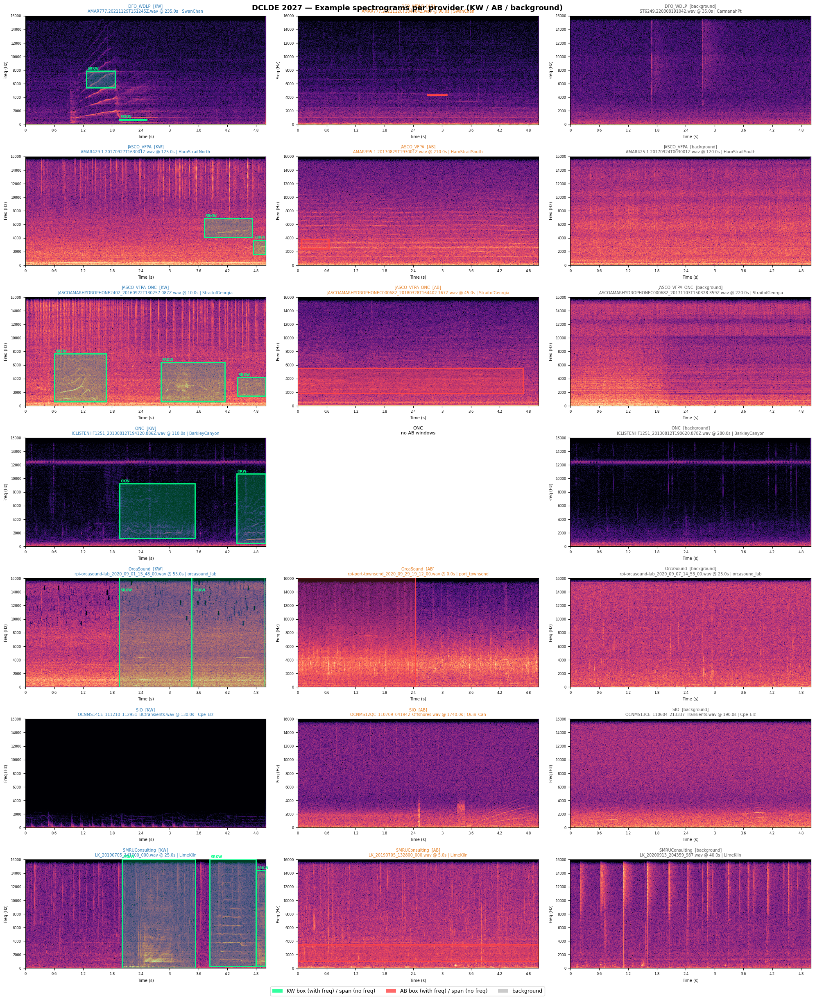

Saved -> /data2/mromaniuc/cet-det/models/perch_v2/DCLDE_2026/figures/spectrograms_per_provider.png


In [9]:
#@title Visualize example spectrograms — KW, AB, background per provider with annotation boxes

from matplotlib.patches import Rectangle, Patch
import librosa.display

providers   = sorted(metadata_clean['provider'].unique())
n_providers = len(providers)
classes     = ['KW', 'AB', 'background']
n_cols      = 3

fig, axes = plt.subplots(n_providers, n_cols, figsize=(20, 3.5 * n_providers))
fig.suptitle('DCLDE 2027 — Example spectrograms per provider (KW / AB / background)',
             fontsize=13, fontweight='bold')

label_colors = {'KW': '#2c7bb6', 'AB': '#e67e22', 'background': '#555555'}
ann_edge     = {'KW': '#00ff88', 'AB': '#ff4444'}

def find_annotated_sample(provider, label_clean, target_species, rs=42):
    subset = metadata_clean[
        (metadata_clean['provider'] == provider) &
        (metadata_clean['label_clean'] == label_clean)
    ]
    if len(subset) == 0:
        return None
    for _, row in subset.sample(frac=1, random_state=rs).iterrows():
        annots = df_annot[
            (df_annot['Soundfile'] == row['soundfile']) &
            (df_annot['ClassSpecies'] == target_species)
        ]
        win_start, win_end = row['offset_s'], row['offset_s'] + WINDOW_SIZE_S
        overlap = annots[
            (annots['FileEndSec'] >= win_start) &
            (annots['FileBeginSec'] <= win_end)
        ]
        if len(overlap) > 0:
            return row
    return subset.sample(1, random_state=rs).iloc[0]


for row_idx, provider in enumerate(providers):
    for col_idx, label in enumerate(classes):
        ax = axes[row_idx, col_idx]

        if label in ('KW', 'AB'):
            row = find_annotated_sample(provider, label, label)
        else:
            subset = metadata_clean[
                (metadata_clean['provider'] == provider) &
                (metadata_clean['label_clean'] == label)
            ]
            row = subset.sample(1, random_state=42).iloc[0] if len(subset) > 0 else None

        if row is None:
            ax.axis('off')
            ax.set_title(f'{provider}\nno {label} windows', fontsize=8)
            continue

        try:
            audio_native, native_sr = librosa.load(
                row['wav_path'], sr=None,
                offset=row['offset_s'], duration=WINDOW_SIZE_S, mono=True
            )
            audio = soxr.resample(audio_native, native_sr, sr)

            D    = librosa.stft(audio, n_fft=1024, hop_length=256)
            D_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)
            librosa.display.specshow(D_db, sr=sr, hop_length=256,
                                     x_axis='time', y_axis='linear',
                                     ax=ax, cmap='magma',
                                     vmin=-80, vmax=0)
            ax.set_ylim(0, min(16000, sr // 2))

            # ── Annotation boxes ──────────────────────────────────────────────
            if label in ('KW', 'AB'):
                file_annots = df_annot[df_annot['Soundfile'] == row['soundfile']]
                win_start   = row['offset_s']
                win_end     = win_start + WINDOW_SIZE_S

                for _, ann in file_annots.iterrows():
                    if ann['FileEndSec'] < win_start or ann['FileBeginSec'] > win_end:
                        continue

                    t_start = max(ann['FileBeginSec'], win_start) - win_start
                    t_end   = min(ann['FileEndSec'],   win_end)   - win_start
                    if t_end <= t_start:
                        continue

                    color     = ann_edge.get(ann['ClassSpecies'], '#ffffff')
                    has_freq  = pd.notna(ann['LowFreqHz']) and pd.notna(ann['HighFreqHz'])

                    if has_freq:
                        f_low  = max(float(ann['LowFreqHz']),  0.0)
                        f_high = min(float(ann['HighFreqHz']), 16000.0)
                        if f_high <= f_low:
                            continue
                        # Semi-transparent fill
                        ax.add_patch(Rectangle(
                            (t_start, f_low), t_end - t_start, f_high - f_low,
                            linewidth=0, facecolor=color, alpha=0.25, zorder=5,
                        ))
                        # Solid border
                        ax.add_patch(Rectangle(
                            (t_start, f_low), t_end - t_start, f_high - f_low,
                            linewidth=2.0, edgecolor=color, facecolor='none',
                            alpha=1.0, linestyle='-', zorder=6,
                        ))
                        if ann['ClassSpecies'] == 'KW' and pd.notna(ann.get('Ecotype')):
                            ax.text(t_start + 0.02, f_high + 80,
                                    str(ann['Ecotype']),
                                    fontsize=6, color=color, fontweight='bold',
                                    verticalalignment='bottom', zorder=7)
                    else:
                        # No freq info — full height vertical span
                        ax.axvspan(t_start, t_end, color=color, alpha=0.20, zorder=5)
                        ax.axvline(t_start, color=color, linewidth=1.5, alpha=0.9, zorder=6)
                        ax.axvline(t_end,   color=color, linewidth=1.5, alpha=0.9, zorder=6)
                        if ann['ClassSpecies'] == 'KW' and pd.notna(ann.get('Ecotype')):
                            ax.text(t_start + 0.02, 14500,
                                    str(ann['Ecotype']),
                                    fontsize=6, color=color, fontweight='bold',
                                    verticalalignment='top', zorder=7)

            ax.set_title(
                f'{provider}  [{label}]\n'
                f'{Path(row["wav_path"]).name} @ {row["offset_s"]:.1f}s | {row["dataset"]}',
                fontsize=7, color=label_colors[label]
            )

        except Exception as e:
            ax.axis('off')
            ax.set_title(f'{provider} [{label}]\n{str(e)[:60]}', fontsize=7)

        ax.set_xlabel('Time (s)', fontsize=7)
        ax.set_ylabel('Freq (Hz)', fontsize=7)
        ax.tick_params(labelsize=6)

fig.legend(handles=[
    Patch(facecolor=ann_edge['KW'],  alpha=0.8, label='KW box (with freq) / span (no freq)'),
    Patch(facecolor=ann_edge['AB'],  alpha=0.8, label='AB box (with freq) / span (no freq)'),
    Patch(facecolor='#555555',       alpha=0.3, label='background'),
], loc='lower center', ncol=3, fontsize=9, bbox_to_anchor=(0.5, -0.01))

plt.tight_layout()
os.makedirs(f'{save_dir}/figures', exist_ok=True)
out = f'{save_dir}/figures/spectrograms_per_provider.png'
plt.savefig(out, dpi=130, bbox_inches='tight')
plt.show()
print(f'Saved -> {out}')

In [10]:
#@title Cell 1 — File-level split + experiment definitions

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# ── File-level split stratified by provider ───────────────────────────────────
file_info = (
    metadata_clean[['soundfile', 'provider']]
    .drop_duplicates('soundfile')
    .reset_index(drop=True)
)

train_files, test_files = train_test_split(
    file_info['soundfile'],
    test_size    = test_size,
    random_state = random_seed,
    stratify     = file_info['provider'],
)
train_files = set(train_files)
test_files  = set(test_files)

train_mask = metadata_clean['soundfile'].isin(train_files).values
test_mask  = metadata_clean['soundfile'].isin(test_files).values

print(f'Train files: {len(train_files):,}  |  Test files: {len(test_files):,}')
print(f'Train windows: {train_mask.sum():,}  |  Test windows: {test_mask.sum():,}')

# ── Experiment definitions ────────────────────────────────────────────────────
# Each experiment is:
#   name       : display label
#   include_fn : which y_clean rows to include
#   label_fn   : what binary label to assign each row

y_series = pd.Series(y_clean)
is_kw    = np.isin(y_clean, ['KW', 'AB+KW'])
is_ab    = y_series == 'AB'
is_bg    = y_series == 'background'

experiments = {
    'A — KW vs all bg': {
        'include': is_kw | is_ab | is_bg,
        'labels':  np.where(is_kw, 'KW', 'background'),
        'desc':    'KW vs AB + unannotated background',
    },
    'B — KW vs AB only': {
        'include': is_kw | is_ab,
        'labels':  np.where(is_kw, 'KW', 'background'),
        'desc':    'KW vs hard negatives (AB) only',
    },
    'C — KW vs unannotated bg': {
        'include': is_kw | is_bg,
        'labels':  np.where(is_kw, 'KW', 'background'),
        'desc':    'KW vs easy negatives (unannotated bg) only',
    },
}

# Pre-build train/test arrays for each experiment
for exp_name, exp in experiments.items():
    inc      = exp['include']
    labels   = exp['labels']

    tr_mask  = train_mask & inc
    te_mask  = test_mask  & inc

    le_exp   = LabelEncoder()
    y_tr     = le_exp.fit_transform(labels[tr_mask])
    y_te     = le_exp.transform(labels[te_mask])

    exp['tr_mask'] = tr_mask
    exp['te_mask'] = te_mask
    exp['X_tr']    = X_clean[tr_mask]
    exp['X_te']    = X_clean[te_mask]
    exp['Z_tr']    = Z_clean[tr_mask]
    exp['Z_te']    = Z_clean[te_mask]
    exp['y_tr']    = y_tr
    exp['y_te']    = y_te
    exp['le']      = le_exp
    exp['kw_idx']  = list(le_exp.classes_).index('KW')

    print(f'\n  [{exp_name}]  {exp["desc"]}')
    print(f'    Train: {tr_mask.sum():,}  '
          f'KW={int(is_kw[tr_mask].sum()):,}  bg={int((~is_kw)[tr_mask].sum()):,}')
    print(f'    Test : {te_mask.sum():,}  '
          f'KW={int(is_kw[te_mask].sum()):,}  bg={int((~is_kw)[te_mask].sum()):,}')

Train files: 1,366  |  Test files: 586
Train windows: 121,987  |  Test windows: 52,551

  [A — KW vs all bg]  KW vs AB + unannotated background
    Train: 121,987  KW=15,281  bg=106,706
    Test : 52,551  KW=6,415  bg=46,136

  [B — KW vs AB only]  KW vs hard negatives (AB) only
    Train: 16,909  KW=15,281  bg=1,628
    Test : 6,904  KW=6,415  bg=489

  [C — KW vs unannotated bg]  KW vs easy negatives (unannotated bg) only
    Train: 120,359  KW=15,281  bg=105,078
    Test : 52,062  KW=6,415  bg=45,647


In [12]:
#@title Cell 2 — Zero-shot evaluation (Perch V2 built-in logits)
from sklearn.metrics import roc_auc_score, f1_score, classification_report

label_to_perch = {
    'KW':         'Orcinus orca',
    'background': 'Water',
}

class_names_list = list(embedding_model.class_list['labels'].classes)

print('Label → Perch V2 class mapping:')
for cls, pname in label_to_perch.items():
    found = pname in class_names_list
    print(f'  {cls:20s} → {pname:35s} {"✓" if found else "✗ NOT FOUND"}')

def zero_shot_predict(Z_subset, le_exp):
    class_names = list(le_exp.classes_)
    preds = []
    for logits in Z_subset:
        scores = {}
        for cls in class_names:
            pname = label_to_perch.get(cls)
            scores[cls] = (logits[class_names_list.index(pname)]
                           if pname and pname in class_names_list
                           else -np.inf)
        preds.append(max(scores, key=scores.get))
    return le_exp.transform(preds)

print(f'\n{"="*65}')
print('  Zero-shot results across experiments')
print(f'{"="*65}')

for exp_name, exp in experiments.items():
    le_exp   = exp['le']
    y_te     = exp['y_te']
    Z_te     = exp['Z_te']
    kw_idx   = exp['kw_idx']
    cnames   = list(le_exp.classes_)

    y_pred_zs = zero_shot_predict(Z_te, le_exp)
    auc_zs    = roc_auc_score(
        y_te,
        [label_to_perch.get(c, '') in class_names_list and
         Z_te[i, class_names_list.index(label_to_perch['KW'])]
         for i, c in enumerate(le_exp.inverse_transform(y_pred_zs))]
    ) if 'Orcinus orca' in class_names_list else float('nan')

    print(f'\n  [{exp_name}]')
    print(classification_report(y_te, y_pred_zs, target_names=cnames, digits=4))

Label → Perch V2 class mapping:
  KW                   → Orcinus orca                        ✓
  background           → Water                               ✓

  Zero-shot results across experiments

  [A — KW vs all bg]
              precision    recall  f1-score   support

          KW     0.7144    0.2125    0.3275      6415
  background     0.9002    0.9882    0.9422     46136

    accuracy                         0.8935     52551
   macro avg     0.8073    0.6003    0.6348     52551
weighted avg     0.8776    0.8935    0.8671     52551


  [B — KW vs AB only]
              precision    recall  f1-score   support

          KW     0.9956    0.2125    0.3502      6415
  background     0.0873    0.9877    0.1604       489

    accuracy                         0.2674      6904
   macro avg     0.5414    0.6001    0.2553      6904
weighted avg     0.9313    0.2674    0.3368      6904


  [C — KW vs unannotated bg]
              precision    recall  f1-score   support

          KW     0

In [13]:
#@title Cell 3 — ML classifiers across all 3 experiments

from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_auc_score, f1_score, classification_report
from sklearn.preprocessing import StandardScaler
import time

classifiers = {
    'Logistic Regression': lambda: LogisticRegression(
        max_iter=1000, random_state=random_seed, class_weight='balanced'),
    'Decision Tree':       lambda: DecisionTreeClassifier(
        max_depth=8, random_state=random_seed, class_weight='balanced'),
    'Random Forest':       lambda: RandomForestClassifier(
        n_estimators=100, max_depth=15,
        random_state=random_seed, class_weight='balanced', n_jobs=-1),
    'SGD (linear SVM)':    lambda: SGDClassifier(
        loss='hinge', class_weight='balanced',
        random_state=random_seed, max_iter=1000, n_jobs=-1),
}

all_results = {}

for exp_name, exp in experiments.items():
    print(f'\n{"="*65}')
    print(f'  {exp_name} — {exp["desc"]}')
    print(f'{"="*65}')

    le_exp   = exp['le']
    kw_idx   = exp['kw_idx']
    cnames   = list(le_exp.classes_)

    scaler     = StandardScaler()
    X_tr_sc    = scaler.fit_transform(exp['X_tr'])
    X_te_sc    = scaler.transform(exp['X_te'])
    exp['scaler'] = scaler   # store for later use

    cond_results = {}

    for clf_name, clf_fn in classifiers.items():
        clf = clf_fn()
        print(f'\n  {clf_name}...')
        t0 = time.time()

        clf.fit(X_tr_sc, exp['y_tr'])
        y_pred  = clf.predict(X_te_sc)
        elapsed = time.time() - t0

        # probability scores — SGD uses decision_function
        if hasattr(clf, 'predict_proba'):
            y_score = clf.predict_proba(X_te_sc)[:, kw_idx]
        else:
            df      = clf.decision_function(X_te_sc)
            y_score = (df - df.min()) / (df.max() - df.min())   # normalise to [0,1]

        f1_macro     = f1_score(exp['y_te'], y_pred, average='macro')
        f1_per_class = f1_score(exp['y_te'], y_pred, average=None,
                                labels=range(len(cnames)))
        train_acc    = clf.score(X_tr_sc, exp['y_tr'])
        test_acc     = clf.score(X_te_sc,  exp['y_te'])
        auc          = roc_auc_score(exp['y_te'], y_score)
        # flip if inverted
        if auc < 0.5:
            auc    = 1 - auc
            y_score = 1 - y_score

        cond_results[clf_name] = {
            'clf': clf, 'y_pred': y_pred, 'y_score': y_score,
            'f1_macro': f1_macro, 'f1_per_class': f1_per_class,
            'train_acc': train_acc, 'test_acc': test_acc,
            'auc': auc, 'time_s': elapsed,
        }

        print(f'  {elapsed:.1f}s | Train: {train_acc:.4f} | Test: {test_acc:.4f} | '
              f'Macro F1: {f1_macro:.4f} | AUC: {auc:.4f}')
        print(classification_report(exp['y_te'], y_pred,
                                    target_names=cnames, digits=4))

    all_results[exp_name] = cond_results

# ── Cross-experiment summary ──────────────────────────────────────────────────
print(f'\n{"="*80}')
print('  CROSS-EXPERIMENT SUMMARY — Macro F1 / AUC')
print(f'{"="*80}')
col_w = 22
print(f'  {"Classifier":<22}' +
      ''.join(f'  {e[:col_w]:>{col_w}}' for e in experiments))
print('  ' + '-'*78)
for clf_name in classifiers:
    row = f'  {clf_name:<22}'
    for exp_name in experiments:
        res = all_results[exp_name][clf_name]
        row += f'  {res["f1_macro"]:.4f}/{res["auc"]:.4f}    '
    print(row)


  A — KW vs all bg — KW vs AB + unannotated background

  Logistic Regression...
  16.2s | Train: 0.9068 | Test: 0.9000 | Macro F1: 0.8123 | AUC: 0.9545
              precision    recall  f1-score   support

          KW     0.5568    0.8870    0.6841      6415
  background     0.9829    0.9018    0.9406     46136

    accuracy                         0.9000     52551
   macro avg     0.7698    0.8944    0.8123     52551
weighted avg     0.9309    0.9000    0.9093     52551


  Decision Tree...
  226.6s | Train: 0.8838 | Test: 0.8718 | Macro F1: 0.7709 | AUC: 0.8938
              precision    recall  f1-score   support

          KW     0.4857    0.8525    0.6189      6415
  background     0.9771    0.8745    0.9230     46136

    accuracy                         0.8718     52551
   macro avg     0.7314    0.8635    0.7709     52551
weighted avg     0.9171    0.8718    0.8858     52551


  Random Forest...
  24.2s | Train: 0.9632 | Test: 0.9216 | Macro F1: 0.8249 | AUC: 0.9500
       

In [14]:
# ── Save sklearn results — complete ──────────────────────────────────────────
import pickle

# 1. Full pickle — everything including fitted clf, y_pred, y_score, curves
sklearn_save_path = f'{save_dir}/embeddings/sklearn_results.pkl'
pickle.dump(all_results, open(sklearn_save_path, 'wb'))
print(f'Saved full pickle -> {sklearn_save_path}')

# 2. Per-experiment npz — y_pred, y_score, y_te for plotting
for exp_name, exp in experiments.items():
    exp_res  = all_results[exp_name]
    slug     = exp_name.split('—')[0].strip().replace(' ', '_')
    out_path = f'{save_dir}/embeddings/sklearn_preds_{slug}.npz'

    save_dict = {
        'y_te':    exp['y_te'],
        'classes': np.array(list(exp['le'].classes_)),
        'kw_idx':  np.array(exp['kw_idx']),
    }
    for clf_name, res in exp_res.items():
        key = clf_name.replace(' ', '_').replace('(', '').replace(')', '')
        save_dict[f'{key}_y_pred']  = res['y_pred']
        save_dict[f'{key}_y_score'] = res['y_score']

    np.savez(out_path, **save_dict)
    print(f'Saved preds npz  -> {out_path}')

# 3. Full CSV summary — all metrics including per-class F1
from sklearn.metrics import precision_recall_fscore_support

rows = []
for exp_name, exp_res in all_results.items():
    exp    = experiments[exp_name]
    y_te   = exp['y_te']
    cnames = list(exp['le'].classes_)
    n_cls  = len(cnames)

    for clf_name, res in exp_res.items():
        p, r, f, s = precision_recall_fscore_support(
            y_te, res['y_pred'],
            labels=list(range(n_cls)), zero_division=0
        )
        row = {
            'experiment': exp_name,
            'classifier': clf_name,
            'macro_f1':   round(res['f1_macro'],  4),
            'roc_auc':    round(res['auc'],        4),
            'train_acc':  round(res['train_acc'],  4),
            'test_acc':   round(res['test_acc'],   4),
            'gap':        round(abs(res['train_acc'] - res['test_acc']), 4),
            'time_s':     round(res['time_s'],     1),
        }
        for i, cls in enumerate(cnames):
            row[f'{cls}_precision'] = round(p[i], 4)
            row[f'{cls}_recall']    = round(r[i], 4)
            row[f'{cls}_f1']        = round(f[i], 4)
            row[f'{cls}_support']   = int(s[i])
        rows.append(row)

summary_df = pd.DataFrame(rows)
csv_path   = f'{save_dir}/embeddings/sklearn_results_summary.csv'
summary_df.to_csv(csv_path, index=False)
print(f'Saved summary CSV  -> {csv_path}')
print(f'\n{summary_df.to_string(index=False)}')

Saved full pickle -> /data2/mromaniuc/cet-det/models/perch_v2/DCLDE_2026/embeddings/sklearn_results.pkl
Saved preds npz  -> /data2/mromaniuc/cet-det/models/perch_v2/DCLDE_2026/embeddings/sklearn_preds_A.npz
Saved preds npz  -> /data2/mromaniuc/cet-det/models/perch_v2/DCLDE_2026/embeddings/sklearn_preds_B.npz
Saved preds npz  -> /data2/mromaniuc/cet-det/models/perch_v2/DCLDE_2026/embeddings/sklearn_preds_C.npz
Saved summary CSV  -> /data2/mromaniuc/cet-det/models/perch_v2/DCLDE_2026/embeddings/sklearn_results_summary.csv

              experiment          classifier  macro_f1  roc_auc  train_acc  test_acc    gap  time_s  KW_precision  KW_recall  KW_f1  KW_support  background_precision  background_recall  background_f1  background_support
        A — KW vs all bg Logistic Regression    0.8123   0.9545     0.9068    0.9000 0.0068    16.2        0.5568     0.8870 0.6841        6415                0.9829             0.9018         0.9406               46136
        A — KW vs all bg       De

In [17]:
#@title Cell — PyTorch MLP across all 3 experiments (OOM-safe + incremental save)

import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.model_selection import train_test_split
from sklearn.metrics import (classification_report, f1_score,
                              roc_auc_score, accuracy_score)
import copy, time, os, pickle
import numpy as np

# ── Config ────────────────────────────────────────────────────────────────────
SAVE_DIR = '/data2/mromaniuc/cet-det/models/perch_v2/DCLDE_2026/embeddings/mlp'
os.makedirs(SAVE_DIR, exist_ok=True)

torch_mlp_configs = {
    'PyTorch MLP (128) drop=0.4': {
        'hidden': (128,), 'dropout': 0.4, 'lr': 1e-4,
        'weight_decay': 1e-3, 'epochs': 300, 'patience': 30, 'batch_size': 256,
    },
    'PyTorch MLP (64) drop=0.4': {
        'hidden': (64,), 'dropout': 0.4, 'lr': 1e-4,
        'weight_decay': 1e-3, 'epochs': 300, 'patience': 30, 'batch_size': 256,
    },
}

# ── Multi-GPU device selection ────────────────────────────────────────────────
if torch.cuda.device_count() > 1:
    # Pick the GPU with most free memory
    free_mem = []
    for i in range(torch.cuda.device_count()):
        free, total = torch.cuda.mem_get_info(i)
        free_mem.append(free)
        print(f'  GPU {i}: {free/1e9:.1f} GB free / {total/1e9:.1f} GB total')
    best_gpu = int(np.argmax(free_mem))
    print(f'  → Using GPU {best_gpu}')
    device = torch.device(f'cuda:{best_gpu}')
elif torch.cuda.is_available():
    device = torch.device('cuda:0')
    free, total = torch.cuda.mem_get_info(0)
    print(f'Using device: cuda:0  ({free/1e9:.1f} GB free / {total/1e9:.1f} GB total)')
else:
    device = torch.device('cpu')
    print('Using device: cpu')

# ── Architecture builder ──────────────────────────────────────────────────────
def build_mlp(input_dim, hidden_sizes, dropout, n_classes):
    layers, in_dim = [], input_dim
    for h in hidden_sizes:
        layers += [nn.Linear(in_dim, h), nn.ReLU(), nn.Dropout(dropout)]
        in_dim = h
    layers.append(nn.Linear(in_dim, n_classes))
    return nn.Sequential(*layers)

# ── Helper: flush GPU cache between runs ──────────────────────────────────────
def clear_gpu():
    torch.cuda.synchronize()
    torch.cuda.empty_cache()
    import gc; gc.collect()

# ── Helper: move data to GPU in chunks to avoid spike allocations ─────────────
def to_tensor_cpu(arr, dtype):
    """Keep on CPU; move to device lazily inside DataLoader / manual .to(device)."""
    return torch.tensor(arr, dtype=dtype)   # stays on CPU

# ── Resume helper ─────────────────────────────────────────────────────────────
def result_path(exp_name, cfg_name):
    safe = lambda s: s.replace(' ', '_').replace('/', '-').replace('(','').replace(')','')
    return os.path.join(SAVE_DIR, f'{safe(exp_name)}__{safe(cfg_name)}.pkl')

mlp_all_results = {}

# ── Main loop ─────────────────────────────────────────────────────────────────
for exp_name, exp in experiments.items():
    print(f'\n{"="*65}')
    print(f'  {exp_name} — {exp["desc"]}')
    print(f'{"="*65}')

    le_exp  = exp['le']
    kw_idx  = exp['kw_idx']
    cnames  = list(le_exp.classes_)
    n_cls   = len(cnames)
    scaler  = exp['scaler']

    # Scale on CPU — keep as numpy until needed
    X_tr_sc = scaler.transform(exp['X_tr'])
    X_te_sc = scaler.transform(exp['X_te'])
    y_tr_np = exp['y_tr']
    y_te_np = exp['y_te']

    class_counts  = np.bincount(y_tr_np, minlength=n_cls)
    class_weights = torch.tensor(
        [class_counts.sum() / (n_cls * c) for c in class_counts],
        dtype=torch.float32
    ).to(device)
    print(f'  Class weights: {dict(zip(cnames, class_weights.cpu().numpy().round(3)))}')

    cond_results = {}

    for cfg_name, cfg in torch_mlp_configs.items():
        rpath = result_path(exp_name, cfg_name)

        # ── Resume: skip if already saved ─────────────────────────────────
        if os.path.exists(rpath):
            print(f'\n  [{cfg_name}]  ✓ already saved — loading from disk')
            with open(rpath, 'rb') as f:
                cond_results[cfg_name] = pickle.load(f)
            continue

        print(f'\n  [{cfg_name}]')
        clear_gpu()   # flush before each new model
        free, _ = torch.cuda.mem_get_info(device.index if device.type == 'cuda' else 0)
        print(f'  GPU free before training: {free/1e9:.2f} GB')

        # Val split (stratified 15 %) — kept on CPU
        X_tr2, X_val, y_tr2, y_val = train_test_split(
            X_tr_sc, y_tr_np, test_size=0.15,
            random_state=random_seed, stratify=y_tr_np
        )

        # CPU tensors — only batches move to GPU inside the loop
        X_tr2_cpu = to_tensor_cpu(X_tr2, torch.float32)
        y_tr2_cpu = to_tensor_cpu(y_tr2, torch.long)
        X_val_t   = to_tensor_cpu(X_val, torch.float32).to(device)
        y_val_t   = to_tensor_cpu(y_val, torch.long).to(device)
        X_te_t    = to_tensor_cpu(X_te_sc, torch.float32).to(device)

        loader = DataLoader(
            TensorDataset(X_tr2_cpu, y_tr2_cpu),
            batch_size=cfg['batch_size'], shuffle=True,
            pin_memory=True,   # faster CPU→GPU transfers
            num_workers=0,
        )

        model     = build_mlp(X_tr_sc.shape[1], cfg['hidden'],
                              cfg['dropout'], n_cls).to(device)
        optimizer = torch.optim.Adam(model.parameters(), lr=cfg['lr'], weight_decay=cfg['weight_decay'])
        criterion = nn.CrossEntropyLoss(weight=class_weights)

        best_val_loss    = float('inf')
        patience_counter = 0
        best_state       = None
        best_epoch       = 0
        train_losses, val_losses = [], []
        train_accs,   val_accs   = [], []
        t0 = time.time()

        for epoch in range(1, cfg['epochs'] + 1):
            model.train()
            for xb, yb in loader:
                xb, yb = xb.to(device), yb.to(device)   # move batch, not whole dataset
                optimizer.zero_grad()
                criterion(model(xb), yb).backward()
                optimizer.step()

            model.eval()
            with torch.no_grad():
                val_logits = model(X_val_t)
                val_loss   = criterion(val_logits, y_val_t).item()
                val_acc    = (val_logits.argmax(1) == y_val_t).float().mean().item()

            # Train loss: recompute on a CPU-side sample to avoid OOM
            with torch.no_grad():
                sample_idx = np.random.choice(len(X_tr2_cpu), size=4096, replace=False)
                xb_s = X_tr2_cpu[sample_idx].to(device)
                yb_s = y_tr2_cpu[sample_idx].to(device)
                tr_loss = criterion(model(xb_s), yb_s).item()
                tr_acc  = (model(xb_s).argmax(1) == yb_s).float().mean().item()

            train_losses.append(tr_loss); val_losses.append(val_loss)
            train_accs.append(tr_acc);   val_accs.append(val_acc)

            if val_loss < best_val_loss:
                best_val_loss    = val_loss
                patience_counter = 0
                best_epoch       = epoch
                best_state       = copy.deepcopy(model.state_dict())
            else:
                patience_counter += 1
            if patience_counter >= cfg['patience']:
                break

        model.load_state_dict(best_state)
        model.eval()
        with torch.no_grad():
            test_logits = model(X_te_t)
            test_proba  = torch.softmax(test_logits, dim=1).cpu().numpy()[:, kw_idx]
            test_pred   = test_logits.argmax(1).cpu().numpy()

        elapsed  = time.time() - t0
        f1_macro = f1_score(y_te_np, test_pred, average='macro')
        f1_pc    = f1_score(y_te_np, test_pred, average=None, labels=range(n_cls))
        test_acc = accuracy_score(y_te_np, test_pred)
        auc      = roc_auc_score(y_te_np, test_proba)
        if auc < 0.5:
            auc        = 1 - auc
            test_proba = 1 - test_proba

        result = {
            'y_pred': test_pred, 'y_score': test_proba,
            'f1_macro': f1_macro, 'f1_per_class': f1_pc,
            'train_acc': train_accs[-1], 'test_acc': test_acc,
            'auc': auc, 'time_s': elapsed,
            'n_iter': len(train_losses), 'best_epoch': best_epoch,
            'early_stopped': patience_counter >= cfg['patience'],
            'train_losses': train_losses, 'val_losses': val_losses,
            'train_accs': train_accs,   'val_accs': val_accs,
            # store weights as CPU state_dict to avoid VRAM leak
            'state_dict': {k: v.cpu() for k, v in best_state.items()},
            'model_cfg': cfg,
            'input_dim': X_tr_sc.shape[1],
            'n_cls': n_cls,
        }

        # ── Save immediately ───────────────────────────────────────────────
        with open(rpath, 'wb') as f:
            pickle.dump(result, f)
        print(f'  ✓ Saved → {rpath}')

        # Free the model from GPU right away
        del model, optimizer, X_val_t, y_val_t, X_te_t
        del X_tr2_cpu, y_tr2_cpu, best_state
        clear_gpu()

        cond_results[cfg_name] = result

        print(f'  Epochs: {result["n_iter"]} | Best: {best_epoch} | Early stop: {result["early_stopped"]}')
        print(f'  {elapsed:.1f}s | Train: {result["train_acc"]:.4f} | Test: {test_acc:.4f} | '
              f'Macro F1: {f1_macro:.4f} | AUC: {auc:.4f}')
        print(classification_report(y_te_np, test_pred,
                                    target_names=cnames, digits=4))

    mlp_all_results[exp_name] = cond_results

# ── Cross-experiment summary ──────────────────────────────────────────────────
print(f'\n{"="*80}')
print('  CROSS-EXPERIMENT SUMMARY — PyTorch MLP  |  Macro F1 / AUC')
print(f'{"="*80}')
col_w = 22
print(f'  {"Model":<30}' +
      ''.join(f'  {e[:col_w]:>{col_w}}' for e in experiments))
print('  ' + '-'*80)
for cfg_name in torch_mlp_configs:
    row = f'  {cfg_name:<30}'
    for exp_name in experiments:
        res = mlp_all_results[exp_name][cfg_name]
        row += f'  {res["f1_macro"]:.4f}/{res["auc"]:.4f}    '
    print(row)

# ── Merge into all_results ────────────────────────────────────────────────────
for exp_name in experiments:
    all_results[exp_name].update(mlp_all_results[exp_name])
print('\n✓ PyTorch MLP results merged into all_results.')


Using device: cuda:0  (0.5 GB free / 23.6 GB total)

  A — KW vs all bg — KW vs AB + unannotated background
  Class weights: {'KW': 3.991, 'background': 0.572}

  [PyTorch MLP (128) drop=0.4]
  GPU free before training: 0.46 GB
  ✓ Saved → /data2/mromaniuc/cet-det/models/perch_v2/DCLDE_2026/embeddings/mlp/A_—_KW_vs_all_bg__PyTorch_MLP_128_drop=0.4.pkl
  Epochs: 42 | Best: 12 | Early stop: True
  71.1s | Train: 0.9502 | Test: 0.9021 | Macro F1: 0.8180 | AUC: 0.9617
              precision    recall  f1-score   support

          KW     0.5611    0.9102    0.6943      6415
  background     0.9863    0.9010    0.9417     46136

    accuracy                         0.9021     52551
   macro avg     0.7737    0.9056    0.8180     52551
weighted avg     0.9344    0.9021    0.9115     52551


  [PyTorch MLP (64) drop=0.4]
  GPU free before training: 0.78 GB
  ✓ Saved → /data2/mromaniuc/cet-det/models/perch_v2/DCLDE_2026/embeddings/mlp/A_—_KW_vs_all_bg__PyTorch_MLP_64_drop=0.4.pkl
  Epochs: 45

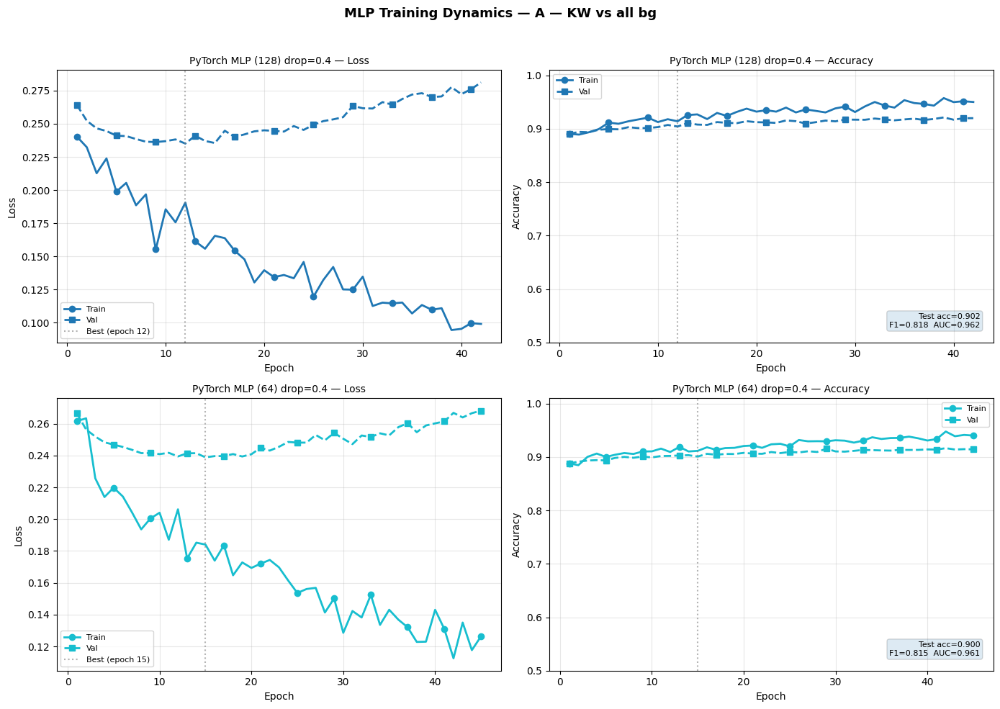

Saved → /data2/mromaniuc/cet-det/models/perch_v2/DCLDE_2026/embeddings/mlp/figures/mlp_dynamics_A.png


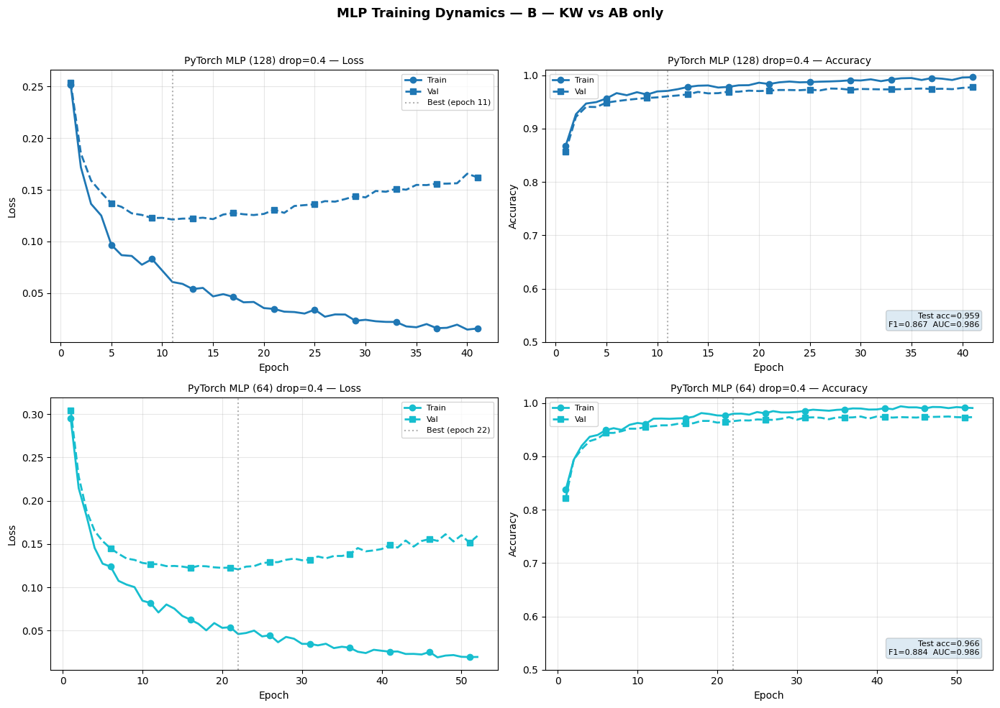

Saved → /data2/mromaniuc/cet-det/models/perch_v2/DCLDE_2026/embeddings/mlp/figures/mlp_dynamics_B.png


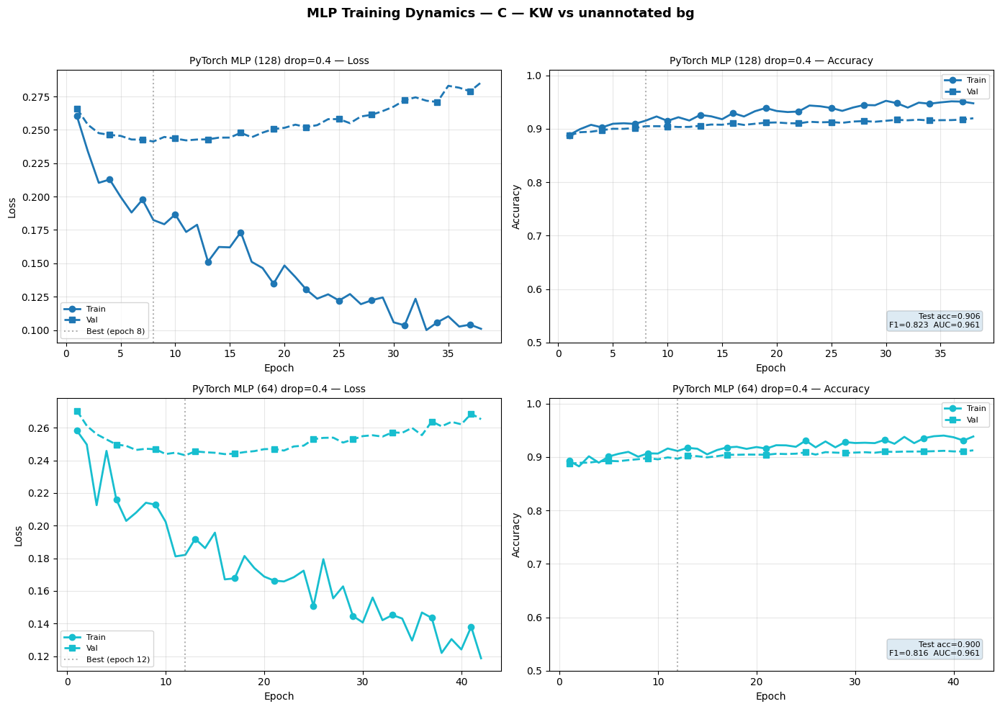

Saved → /data2/mromaniuc/cet-det/models/perch_v2/DCLDE_2026/embeddings/mlp/figures/mlp_dynamics_C.png


In [18]:
#@title Cell 5 — MLP training dynamics per experiment

import matplotlib.pyplot as plt
import numpy as np
import os

fig_dir = os.path.join(SAVE_DIR, 'figures')
os.makedirs(fig_dir, exist_ok=True)

for exp_name, exp_results in mlp_all_results.items():

    # Only plot models that have training curve data
    plottable = {k: v for k, v in exp_results.items()
                 if 'train_losses' in v and v['train_losses']}
    if not plottable:
        print(f'No training curves for {exp_name}, skipping.')
        continue

    n_models = len(plottable)
    fig, axes = plt.subplots(n_models, 2, figsize=(14, 5 * n_models))
    if n_models == 1:
        axes = axes[np.newaxis, :]

    fig.suptitle(f'MLP Training Dynamics — {exp_name}',
                 fontsize=13, fontweight='bold', y=0.98)

    colors = plt.cm.tab10(np.linspace(0, 1, n_models))

    for idx, (model_name, res) in enumerate(plottable.items()):
        color  = colors[idx]
        epochs = np.arange(1, res['n_iter'] + 1)
        every  = max(1, len(epochs) // 10)

        ax_loss = axes[idx, 0]
        ax_loss.plot(epochs, res['train_losses'], label='Train',
                     color=color, linewidth=2, marker='o', markevery=every)
        ax_loss.plot(epochs, res['val_losses'],   label='Val',
                     color=color, linestyle='--', linewidth=2, marker='s', markevery=every)
        ax_loss.axvline(res['best_epoch'], color='gray', linestyle=':', alpha=0.6,
                        label=f'Best (epoch {res["best_epoch"]})')
        ax_loss.set_title(f'{model_name} — Loss', fontsize=10)
        ax_loss.set_xlabel('Epoch'); ax_loss.set_ylabel('Loss')
        ax_loss.legend(fontsize=8); ax_loss.grid(alpha=0.3)

        ax_acc = axes[idx, 1]
        ax_acc.plot(epochs, res['train_accs'], label='Train',
                    color=color, linewidth=2, marker='o', markevery=every)
        ax_acc.plot(epochs, res['val_accs'],   label='Val',
                    color=color, linestyle='--', linewidth=2, marker='s', markevery=every)
        ax_acc.axvline(res['best_epoch'], color='gray', linestyle=':', alpha=0.6)

        # Annotate final test metrics in the accuracy panel
        ax_acc.text(0.97, 0.05,
                    f'Test acc={res["test_acc"]:.3f}\nF1={res["f1_macro"]:.3f}  AUC={res["auc"]:.3f}',
                    transform=ax_acc.transAxes, ha='right', va='bottom',
                    fontsize=8, bbox=dict(boxstyle='round,pad=0.3', alpha=0.15))

        ax_acc.set_title(f'{model_name} — Accuracy', fontsize=10)
        ax_acc.set_xlabel('Epoch'); ax_acc.set_ylabel('Accuracy')
        ax_acc.legend(fontsize=8); ax_acc.grid(alpha=0.3)
        ax_acc.set_ylim(0.5, 1.01)

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    slug = exp_name.split('—')[0].strip().replace(' ', '_')
    out  = os.path.join(fig_dir, f'mlp_dynamics_{slug}.png')
    plt.savefig(out, dpi=130, bbox_inches='tight')
    plt.show()
    print(f'Saved → {out}')


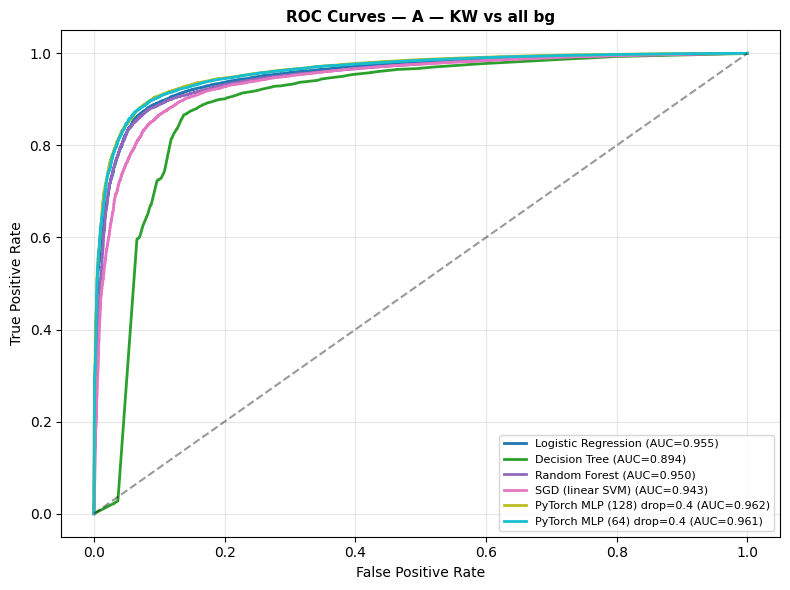

Saved → /data2/mromaniuc/cet-det/models/perch_v2/DCLDE_2026/embeddings/mlp/figures/roc_A.png


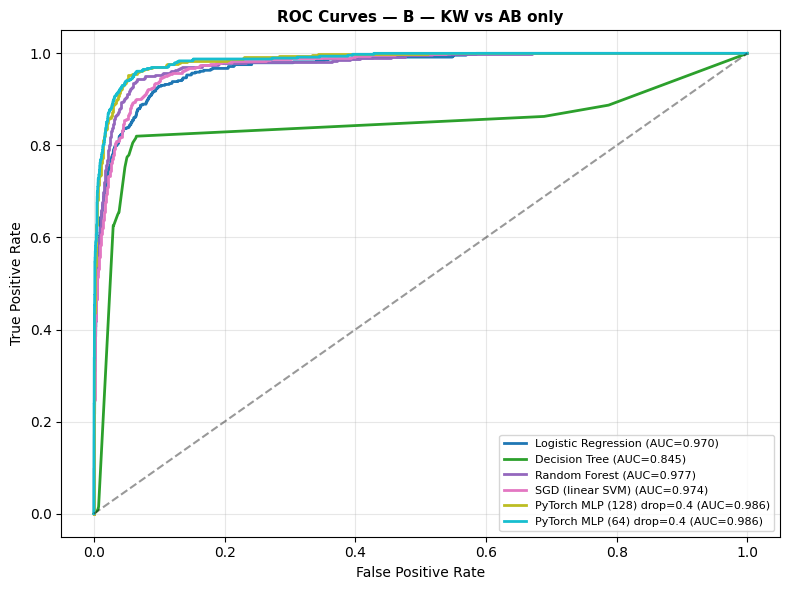

Saved → /data2/mromaniuc/cet-det/models/perch_v2/DCLDE_2026/embeddings/mlp/figures/roc_B.png


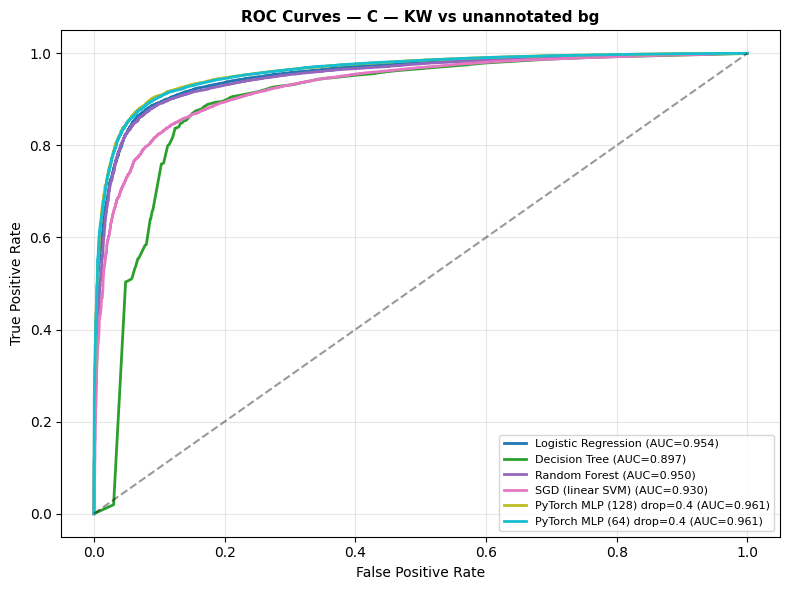

Saved → /data2/mromaniuc/cet-det/models/perch_v2/DCLDE_2026/embeddings/mlp/figures/roc_C.png


In [23]:
#@title Cell 6 — ROC curves per experiment (sklearn + MLP)

import matplotlib.pyplot as plt
import numpy as np
import os
from sklearn.metrics import roc_curve, roc_auc_score

fig_dir = os.path.join(SAVE_DIR, 'figures')
os.makedirs(fig_dir, exist_ok=True)

for exp_name in experiments:
    exp    = experiments[exp_name]
    y_te   = exp['y_te']
    kw_idx = exp['kw_idx']

    combined = {
        **all_results[exp_name],
        **mlp_all_results[exp_name],
    }

    colors = plt.cm.tab10(np.linspace(0, 1, len(combined)))
    fig, ax = plt.subplots(figsize=(8, 6))

    for (clf_name, res), color in zip(combined.items(), colors):
        score = res.get('y_score', res.get('y_proba'))
        if score is None:
            print(f'  ⚠ No score for {clf_name}, skipping.')
            continue
        if score.ndim == 2:
            score = score[:, kw_idx]
        fpr, tpr, _ = roc_curve(y_te, score)                  
        auc = roc_auc_score(y_te, score)
        if auc < 0.5:
            auc = 1 - auc
        ax.plot(fpr, tpr, label=f'{clf_name} (AUC={auc:.3f})',
                color=color, linewidth=2)

    ax.plot([0, 1], [0, 1], 'k--', alpha=0.4)
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.set_title(f'ROC Curves — {exp_name}', fontsize=11, fontweight='bold')
    ax.legend(loc='lower right', fontsize=8)
    ax.grid(alpha=0.3)
    plt.tight_layout()

    slug = exp_name.split('—')[0].strip().replace(' ', '_')
    out  = os.path.join(fig_dir, f'roc_{slug}.png')
    plt.savefig(out, dpi=130, bbox_inches='tight')
    plt.show()
    print(f'Saved → {out}')

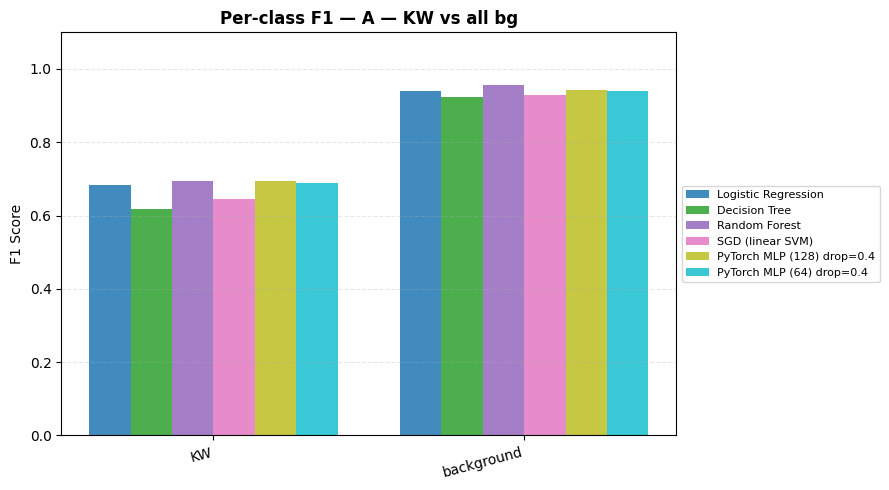

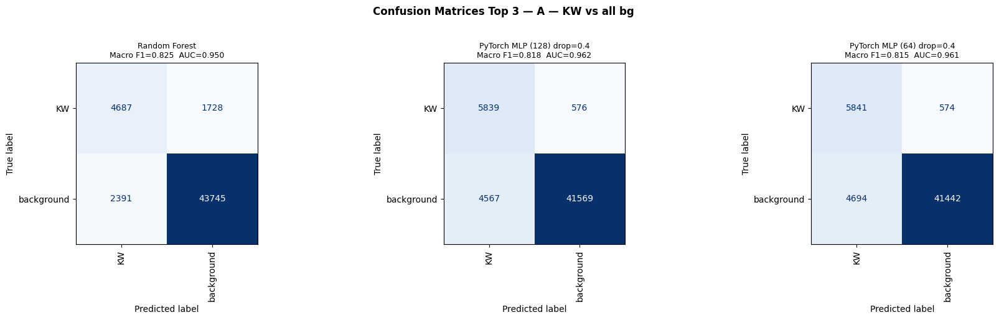

Saved → /data2/mromaniuc/cet-det/models/perch_v2/DCLDE_2026/embeddings/mlp/figures/f1_A.png + confusion_A.png


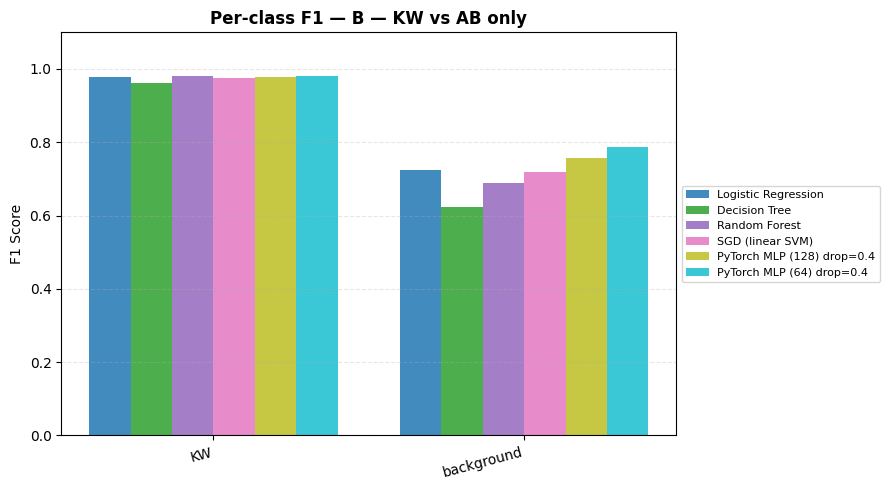

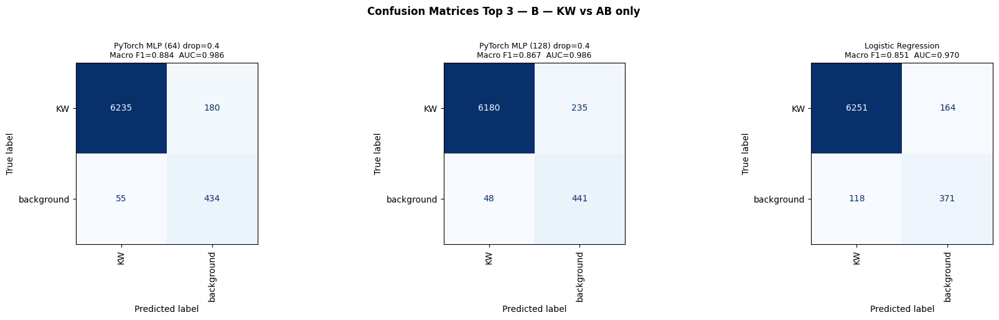

Saved → /data2/mromaniuc/cet-det/models/perch_v2/DCLDE_2026/embeddings/mlp/figures/f1_B.png + confusion_B.png


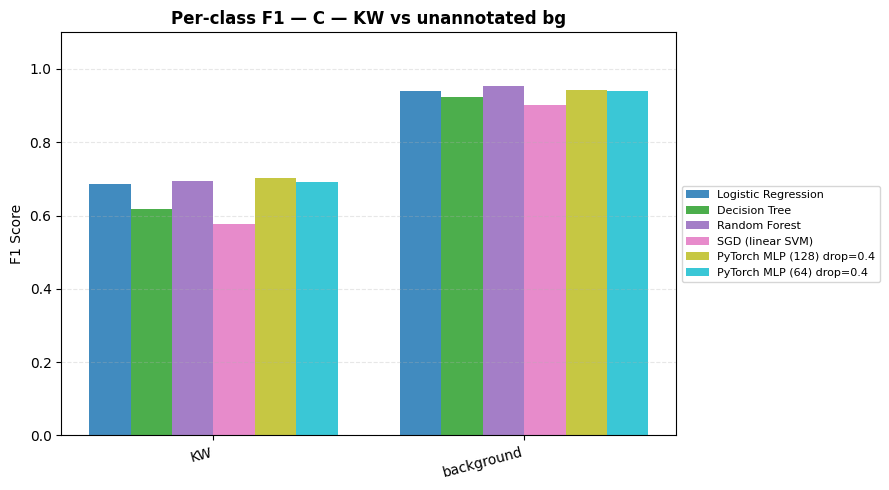

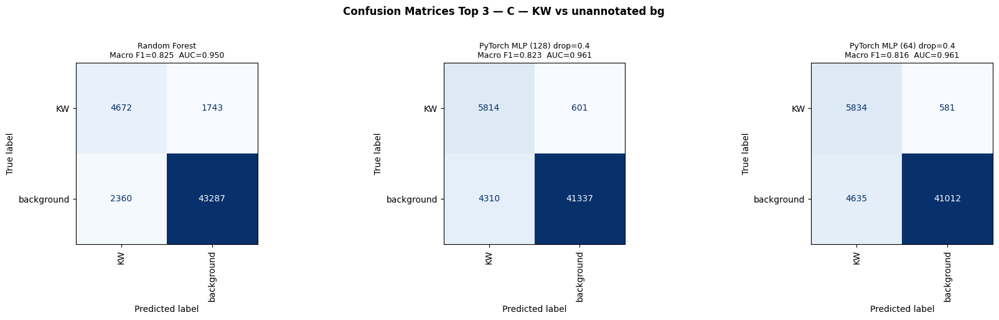

Saved → /data2/mromaniuc/cet-det/models/perch_v2/DCLDE_2026/embeddings/mlp/figures/f1_C.png + confusion_C.png


In [21]:
#@title Cell 7 — Per-class F1 bar chart + confusion matrices per experiment

import os
from sklearn.metrics import ConfusionMatrixDisplay, f1_score

fig_dir = os.path.join(SAVE_DIR, 'figures')
os.makedirs(fig_dir, exist_ok=True)

TOP_N = 3

for exp_name in experiments:
    exp    = experiments[exp_name]
    y_te   = exp['y_te']
    cnames = list(exp['le'].classes_)
    n_cls  = len(cnames)

    combined = {
        **all_results[exp_name],
        **mlp_all_results[exp_name],
    }
    n_clf  = len(combined)
    colors = plt.cm.tab10(np.linspace(0, 1, min(n_clf, 10)))
    slug   = exp_name.split('—')[0].strip().replace(' ', '_')

    # ── F1 bar chart ──────────────────────────────────────────────────────────
    fig, ax = plt.subplots(figsize=(9, 5))
    x     = np.arange(n_cls)
    width = 0.8 / n_clf

    for i, (clf_name, res) in enumerate(combined.items()):
        f1s    = f1_score(y_te, res['y_pred'], labels=list(range(n_cls)),
                          average=None, zero_division=0)
        offset = (i - n_clf / 2 + 0.5) * width
        ax.bar(x + offset, f1s, width, label=clf_name,
               color=colors[i % len(colors)], alpha=0.85)

    ax.set_xticks(x)
    ax.set_xticklabels(cnames, rotation=15, ha='right')
    ax.set_ylabel('F1 Score'); ax.set_ylim(0, 1.1)
    ax.set_title(f'Per-class F1 — {exp_name}', fontweight='bold')
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=8)
    ax.grid(axis='y', linestyle='--', alpha=0.3)
    plt.tight_layout()
    plt.savefig(os.path.join(fig_dir, f'f1_{slug}.png'), dpi=130, bbox_inches='tight')
    plt.show()

    # ── Confusion matrices — top N by macro F1 ────────────────────────────────
    top   = sorted(combined.items(), key=lambda x: x[1]['f1_macro'], reverse=True)[:TOP_N]
    n_top = len(top)   # may be < TOP_N if fewer models exist
    fig, axes = plt.subplots(1, n_top, figsize=(6 * n_top, 5))
    if n_top == 1:
        axes = [axes]

    for ax, (clf_name, res) in zip(axes, top):
        ConfusionMatrixDisplay.from_predictions(
            y_te, res['y_pred'],
            display_labels=cnames,
            ax=ax, colorbar=False,
            xticks_rotation='vertical', cmap='Blues'
        )
        ax.set_title(f'{clf_name}\nMacro F1={res["f1_macro"]:.3f}  AUC={res["auc"]:.3f}',
                     fontsize=9)

    fig.suptitle(f'Confusion Matrices Top {n_top} — {exp_name}',
                 fontsize=12, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.savefig(os.path.join(fig_dir, f'confusion_{slug}.png'),
                dpi=130, bbox_inches='tight')
    plt.show()
    print(f'Saved → {fig_dir}/f1_{slug}.png + confusion_{slug}.png')


In [22]:
#@title Cell 8 — Save full results CSV (all experiments, all classifiers)

import pandas as pd
import os
from sklearn.metrics import precision_recall_fscore_support, roc_auc_score

all_rows = []

for exp_name in experiments:
    exp    = experiments[exp_name]
    y_te   = exp['y_te']
    kw_idx = exp['kw_idx']
    cnames = list(exp['le'].classes_)
    n_cls  = len(cnames)

    combined = {
        **all_results[exp_name],
        **mlp_all_results[exp_name],
    }

    for clf_name, res in combined.items():
        score = res.get('y_score', res.get('y_proba'))
        if score is not None and score.ndim == 2:
            score = score[:, kw_idx]
        try:
            auc = roc_auc_score(y_te, score)
            if auc < 0.5:
                auc = 1 - auc
        except Exception:
            auc = None

        p, r, f, s = precision_recall_fscore_support(
            y_te, res['y_pred'], labels=list(range(n_cls)), zero_division=0
        )
        row = {
            'experiment': exp_name,
            'classifier': clf_name,
            'macro_f1':   round(res['f1_macro'], 4),
            'roc_auc':    round(auc, 4) if auc is not None else None,
            'train_acc':  round(res.get('train_acc', 0), 4),
            'test_acc':   round(res.get('test_acc',  0), 4),
            'gap':        round(abs(res.get('train_acc', 0) - res.get('test_acc', 0)), 4),
            'time_s':     round(res.get('time_s', 0), 1),
        }
        for i, cls in enumerate(cnames):
            row[f'{cls}_precision'] = round(p[i], 4)
            row[f'{cls}_recall']    = round(r[i], 4)
            row[f'{cls}_f1']        = round(f[i], 4)
            row[f'{cls}_support']   = int(s[i])
        all_rows.append(row)

results_df = pd.DataFrame(all_rows)
out_path   = os.path.join(SAVE_DIR, 'all_experiment_results.csv')
results_df.to_csv(out_path, index=False)
print(f'Saved {len(results_df)} rows → {out_path}')

# Macro F1 pivot
pivot = results_df.pivot_table(
    index='classifier', columns='experiment',
    values='macro_f1', aggfunc='first'
)
print('\nMacro F1 summary:')
print(pivot.round(4).to_string())

# AUC pivot
pivot_auc = results_df.pivot_table(
    index='classifier', columns='experiment',
    values='roc_auc', aggfunc='first'
)
print('\nROC-AUC summary:')
print(pivot_auc.round(4).to_string())

try:
    display(results_df.round(4))
except NameError:
    print(results_df.round(4).to_string())


Saved 18 rows → /data2/mromaniuc/cet-det/models/perch_v2/DCLDE_2026/embeddings/mlp/all_experiment_results.csv

Macro F1 summary:
experiment                  A — KW vs all bg  B — KW vs AB only  C — KW vs unannotated bg
classifier                                                                               
Decision Tree                         0.7709             0.7927                    0.7714
Logistic Regression                   0.8123             0.8513                    0.8129
PyTorch MLP (128) drop=0.4            0.8180             0.8673                    0.8235
PyTorch MLP (64) drop=0.4             0.8147             0.8842                    0.8156
Random Forest                         0.8249             0.8341                    0.8248
SGD (linear SVM)                      0.7876             0.8465                    0.7396

ROC-AUC summary:
experiment                  A — KW vs all bg  B — KW vs AB only  C — KW vs unannotated bg
classifier                                 

,experiment,classifier,macro_f1,roc_auc,train_acc,test_acc,gap,time_s,KW_precision,KW_recall,KW_f1,KW_support,background_precision,background_recall,background_f1,background_support
0,A — KW vs all bg,Logistic Regression,0.8123,0.9545,0.9068,0.9000,0.0068,16.2,0.5568,0.8870,0.6841,6415,0.9829,0.9018,0.9406,46136
1,A — KW vs all bg,Decision Tree,0.7709,0.8938,0.8838,0.8718,0.0120,226.6,0.4857,0.8525,0.6189,6415,0.9771,0.8745,0.9230,46136
2,A — KW vs all bg,Random Forest,0.8249,0.9500,0.9632,0.9216,0.0416,24.2,0.6622,0.7306,0.6947,6415,0.9620,0.9482,0.9550,46136
3,A — KW vs all bg,SGD (linear SVM),0.7876,0.9428,0.8876,0.8818,0.0057,49.0,0.5093,0.8837,0.6462,6415,0.9820,0.8816,0.9291,46136
4,A — KW vs all bg,PyTorch MLP (128) drop=0.4,0.8180,0.9617,0.9502,0.9021,0.0481,71.1,0.5611,0.9102,0.6943,6415,0.9863,0.9010,0.9417,46136
5,A — KW vs all bg,PyTorch MLP (64) drop=0.4,0.8147,0.9605,0.9402,0.8998,0.0404,78.4,0.5544,0.9105,0.6892,6415,0.9863,0.8983,0.9402,46136
6,B — KW vs AB only,Logistic Regression,0.8513,0.9695,0.9986,0.9592,0.0395,2.0,0.9815,0.9744,0.9779,6415,0.6935,0.7587,0.7246,489
7,B — KW vs AB only,Decision Tree,0.7927,0.8450,0.9474,0.9311,0.0163,27.3,0.9845,0.9406,0.9621,6415,0.5084,0.8057,0.6234,489
8,B — KW vs AB only,Random Forest,0.8341,0.9768,0.9941,0.9631,0.0310,2.2,0.9684,0.9927,0.9804,6415,0.8567,0.5746,0.6879,489
9,B — KW vs AB only,SGD (linear SVM),0.8465,0.9739,0.9736,0.9550,0.0186,1.6,0.9851,0.9662,0.9755,6415,0.6454,0.8078,0.7175,489


In [24]:
#@title Save full results to CSV — ALL classifiers (binary: background / whistle)
from sklearn.metrics import precision_recall_fscore_support, roc_auc_score
import pandas as pd

all_results = {**results, **mlp_results}

rows = []
for name, res in all_results.items():
    proba = res['y_proba']
    if proba.ndim == 2:
        proba = proba[:, whistle_idx]
    try:
        auc = roc_auc_score(y_test, proba)
    except ValueError:
        auc = None

    p, r, f, s = precision_recall_fscore_support(
        y_test, res['y_pred'], labels=range(len(class_names)), zero_division=0
    )
    row = {
        'classifier':   name,
        'macro_f1':     res['f1_macro'],
        'roc_auc':      auc,
        'time_seconds': res.get('time_s', None),
    }
    for i, cls in enumerate(class_names):
        row[f'{cls}_precision'] = round(p[i], 3)
        row[f'{cls}_recall']    = round(r[i], 3)
        row[f'{cls}_f1']        = round(f[i], 3)
        row[f'{cls}_support']   = s[i]
    rows.append(row)

results_df = pd.DataFrame(rows)
cols = ['classifier', 'macro_f1', 'roc_auc', 'time_seconds'] + \
       [c for c in results_df.columns if c not in ['classifier', 'macro_f1', 'roc_auc', 'time_seconds']]
results_df = results_df[cols]

out_path = f'{save_dir}/perch_v2_all_classifiers_results_binary.csv'
results_df.to_csv(out_path, index=False)
print(f'Saved {len(results_df)} classifiers to {out_path}')
display(results_df.round(3))

Saved 6 classifiers to /data2/mromaniuc/cet-det/models/perch_v2/DRYAD/perch_v2_all_classifiers_results_binary.csv


,classifier,macro_f1,roc_auc,time_seconds,background_precision,background_recall,background_f1,background_support,whistle_precision,whistle_recall,whistle_f1,whistle_support
0,Logistic Regression,0.936,0.980,0.338,0.922,0.914,0.918,337,0.951,0.956,0.953,585
1,Decision Tree,0.899,0.860,10.429,0.877,0.866,0.872,337,0.924,0.930,0.927,585
2,Random Forest,0.936,0.981,1.981,0.933,0.905,0.919,337,0.946,0.962,0.954,585
3,SVM (RBF),0.935,0.981,45.213,0.943,0.890,0.916,337,0.939,0.969,0.954,585
4,PyTorch MLP (128) drop=0.4,0.936,0.985,3.785,0.944,0.893,0.918,337,0.940,0.969,0.955,585
5,PyTorch MLP (64) drop=0.4,0.938,0.986,4.942,0.947,0.896,0.921,337,0.942,0.971,0.956,585


Full embedding matrix: (174538, 1536)

Running full PCA...
  80%=138  90%=290  95%=492  99%=1029 PCs  → using 290


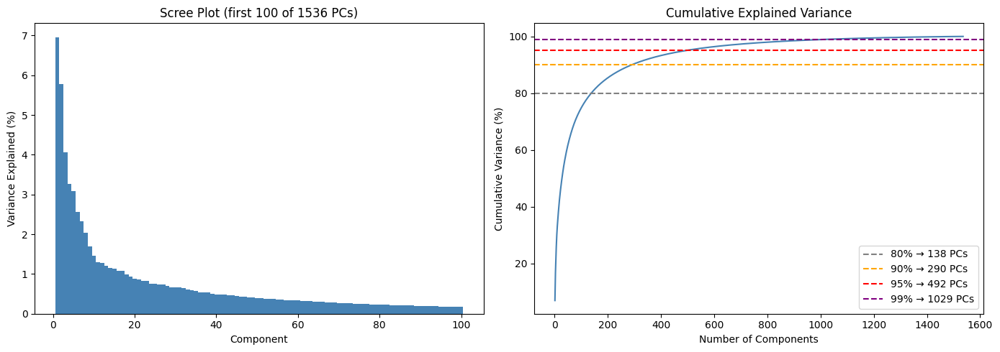

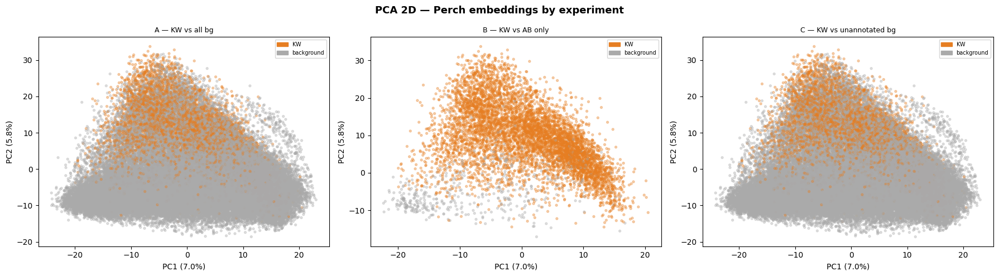


PCA-reduced shape for t-SNE/UMAP: (174538, 290)

Running t-SNE per experiment...
  [A — KW vs all bg] fitting t-SNE on 52,551 points...
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 52551 samples in 0.005s...
[t-SNE] Computed neighbors for 52551 samples in 2.177s...
[t-SNE] Computed conditional probabilities for sample 1000 / 52551
[t-SNE] Computed conditional probabilities for sample 2000 / 52551
[t-SNE] Computed conditional probabilities for sample 3000 / 52551
[t-SNE] Computed conditional probabilities for sample 4000 / 52551
[t-SNE] Computed conditional probabilities for sample 5000 / 52551
[t-SNE] Computed conditional probabilities for sample 6000 / 52551
[t-SNE] Computed conditional probabilities for sample 7000 / 52551
[t-SNE] Computed conditional probabilities for sample 8000 / 52551
[t-SNE] Computed conditional probabilities for sample 9000 / 52551
[t-SNE] Computed conditional probabilities for sample 10000 / 52551
[t-SNE] Computed conditional probabilities for s

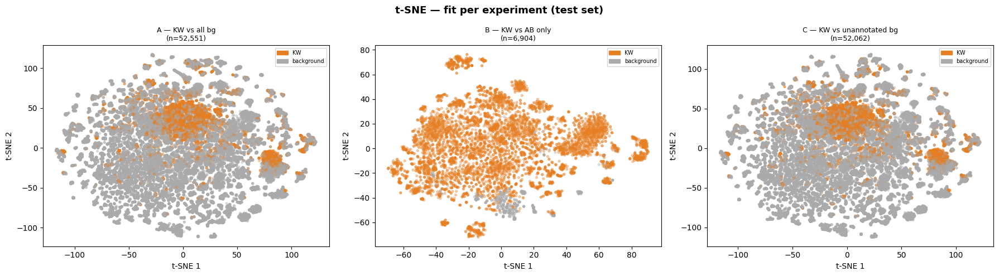


Running UMAP per experiment...
  [A — KW vs all bg] fitting UMAP on 52,551 points...
    UMAP done → cached
  [B — KW vs AB only] fitting UMAP on 6,904 points...
    UMAP done → cached
  [C — KW vs unannotated bg] fitting UMAP on 52,062 points...
    UMAP done → cached


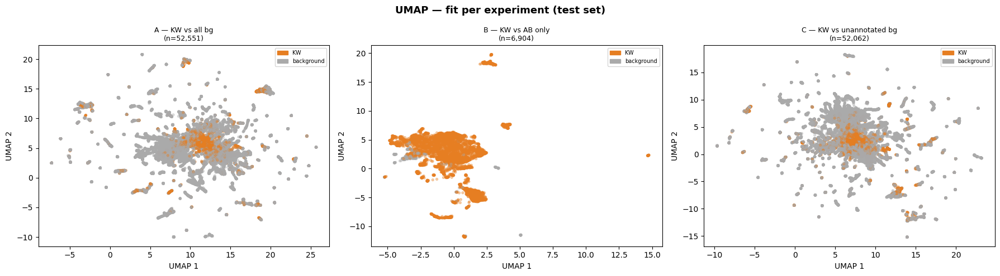


All coordinates saved.
  PCA 2D:      (174538, 2)
  PCA reduced: (174538, 290)
  t-SNE [A — KW vs all bg]: (52551, 2)
  UMAP  [A — KW vs all bg]: (52551, 2)
  t-SNE [B — KW vs AB only]: (6904, 2)
  UMAP  [B — KW vs AB only]: (6904, 2)
  t-SNE [C — KW vs unannotated bg]: (52062, 2)
  UMAP  [C — KW vs unannotated bg]: (52062, 2)


In [25]:
#@title Dimensionality reduction — PCA + t-SNE + UMAP (3-experiment view)

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import pandas as pd
import numpy as np
import os, warnings
warnings.filterwarnings('ignore')

dim_dir = os.path.join(SAVE_DIR, 'dim_red')
os.makedirs(dim_dir, exist_ok=True)

# ── Colour scheme — same two classes across all experiments ───────────────────
colors_map = {
    'KW':         '#e67e22',
    'background': '#AAAAAA',
}
legend_patches = [mpatches.Patch(color=v, label=k) for k, v in colors_map.items()]
alpha, s = 0.35, 8

# ── Scale the FULL embedding matrix once ──────────────────────────────────────
# X_clean is shared; experiments only differ in row masks + labels
scaler_viz = StandardScaler()
X_scaled   = scaler_viz.fit_transform(X_clean)
print(f'Full embedding matrix: {X_scaled.shape}')

# ═══════════════════════════════════════════════════════════════════════════════
# 1. Full PCA — variance analysis (run once on all data)
# ═══════════════════════════════════════════════════════════════════════════════
print('\nRunning full PCA...')
pca_full = PCA(random_state=random_seed)
pca_full.fit(X_scaled)

cumvar  = np.cumsum(pca_full.explained_variance_ratio_) * 100
n_total = len(cumvar)
n80  = int(np.argmax(cumvar >= 80)) + 1
n90  = int(np.argmax(cumvar >= 90)) + 1
n95  = int(np.argmax(cumvar >= 95)) + 1
n99  = int(np.argmax(cumvar >= 99)) + 1
n_pca = n90
print(f'  80%={n80}  90%={n90}  95%={n95}  99%={n99} PCs  → using {n_pca}')

# Scree + cumulative variance
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
n_show = min(100, n_total)
ax1.bar(range(1, n_show + 1),
        pca_full.explained_variance_ratio_[:n_show] * 100,
        color='steelblue', width=1.0)
ax1.set_xlabel('Component'); ax1.set_ylabel('Variance Explained (%)')
ax1.set_title(f'Scree Plot (first {n_show} of {n_total} PCs)')

ax2.plot(range(1, n_total + 1), cumvar, color='steelblue')
for thresh, col, n in [(80, 'gray', n80), (90, 'orange', n90),
                         (95, 'red', n95), (99, 'purple', n99)]:
    ax2.axhline(thresh, color=col, linestyle='--', label=f'{thresh}% → {n} PCs')
ax2.set_xlabel('Number of Components'); ax2.set_ylabel('Cumulative Variance (%)')
ax2.set_title('Cumulative Explained Variance'); ax2.legend()
plt.tight_layout()
plt.savefig(os.path.join(dim_dir, 'pca_variance.png'), dpi=150)
plt.show()

# ═══════════════════════════════════════════════════════════════════════════════
# 2. PCA 2D — one panel per experiment (same projection, different mask+colour)
# ═══════════════════════════════════════════════════════════════════════════════
pca2   = PCA(n_components=2, random_state=random_seed)
X_pca2 = pca2.fit_transform(X_scaled)   # computed once on ALL rows

fig, axes = plt.subplots(1, 3, figsize=(18, 5))
fig.suptitle('PCA 2D — Perch embeddings by experiment', fontsize=13, fontweight='bold')

for ax, (exp_name, exp) in zip(axes, experiments.items()):
    mask   = exp['te_mask']          # test-set rows for this experiment
    labels = exp['le'].inverse_transform(exp['y_te'])
    c      = np.array([colors_map[l] for l in labels])

    ax.scatter(X_pca2[mask, 0], X_pca2[mask, 1],
               c=c, alpha=alpha, s=s, rasterized=True)
    ax.set_xlabel(f'PC1 ({pca2.explained_variance_ratio_[0]*100:.1f}%)')
    ax.set_ylabel(f'PC2 ({pca2.explained_variance_ratio_[1]*100:.1f}%)')
    ax.set_title(exp_name, fontsize=9)
    ax.legend(handles=legend_patches, fontsize=7)

plt.tight_layout()
plt.savefig(os.path.join(dim_dir, 'pca_2d_experiments.png'), dpi=150, bbox_inches='tight')
plt.show()

# ═══════════════════════════════════════════════════════════════════════════════
# 3. PCA-reduce to n_pca dims → input for t-SNE / UMAP
# ═══════════════════════════════════════════════════════════════════════════════
pca_red   = PCA(n_components=n_pca, random_state=random_seed)
X_pca_red = pca_red.fit_transform(X_scaled)
print(f'\nPCA-reduced shape for t-SNE/UMAP: {X_pca_red.shape}')
# ═══════════════════════════════════════════════════════════════════════════════
# 4. t-SNE — fit separately per experiment on test-set subset
# ═══════════════════════════════════════════════════════════════════════════════
print('\nRunning t-SNE per experiment...')
fig_tsne, axes_tsne = plt.subplots(1, 3, figsize=(18, 5))
fig_tsne.suptitle('t-SNE — fit per experiment (test set)',
                  fontsize=13, fontweight='bold')

tsne_coords = {}   # add this BEFORE the t-SNE loop


for ax, (exp_name, exp) in zip(axes_tsne, experiments.items()):
    mask   = exp['te_mask']
    labels = exp['le'].inverse_transform(exp['y_te'])
    c      = np.array([colors_map[l] for l in labels])

    slug       = exp_name.split('—')[0].strip().replace(' ', '_')
    tsne_cache = os.path.join(dim_dir, f'coords_tsne_{slug}.npy')

    if os.path.exists(tsne_cache):
        print(f'  [{exp_name}] loading cached t-SNE')
        X_tsne_exp = np.load(tsne_cache)

    else:
        print(f'  [{exp_name}] fitting t-SNE on {mask.sum():,} points...')
        tsne = TSNE(
            n_components=2, perplexity=40, learning_rate='auto',
            init='pca', max_iter=1000, metric='euclidean',
            random_state=random_seed, verbose=1
        )
        X_tsne_exp = tsne.fit_transform(X_pca_red[mask])
        np.save(tsne_cache, X_tsne_exp)
        print(f'    KL={tsne.kl_divergence_:.4f} → cached')
    tsne_coords[exp_name] = X_tsne_exp   # add at end of loop body


    ax.scatter(X_tsne_exp[:, 0], X_tsne_exp[:, 1],
               c=c, alpha=alpha, s=s, rasterized=True)
    ax.set_title(f'{exp_name}\n(n={mask.sum():,})', fontsize=9)
    ax.set_xlabel('t-SNE 1'); ax.set_ylabel('t-SNE 2')
    ax.legend(handles=legend_patches, fontsize=7)

plt.tight_layout()
plt.savefig(os.path.join(dim_dir, 'tsne_experiments.png'),
            dpi=150, bbox_inches='tight')
plt.show()

# ═══════════════════════════════════════════════════════════════════════════════
# 5. UMAP — same: fit separately per experiment
# ═══════════════════════════════════════════════════════════════════════════════
try:
    import umap
except ImportError:
    import subprocess
    subprocess.run(['pip', 'install', 'umap-learn', '-q'])
    import umap

umap_coords = {}   # add this BEFORE the UMAP loop

print('\nRunning UMAP per experiment...')
fig_umap, axes_umap = plt.subplots(1, 3, figsize=(18, 5))
fig_umap.suptitle('UMAP — fit per experiment (test set)',
                  fontsize=13, fontweight='bold')

for ax, (exp_name, exp) in zip(axes_umap, experiments.items()):
    mask   = exp['te_mask']
    labels = exp['le'].inverse_transform(exp['y_te'])
    c      = np.array([colors_map[l] for l in labels])

    slug       = exp_name.split('—')[0].strip().replace(' ', '_')
    umap_cache = os.path.join(dim_dir, f'coords_umap_{slug}.npy')

    if os.path.exists(umap_cache):
        print(f'  [{exp_name}] loading cached UMAP')
        X_umap_exp = np.load(umap_cache)

    else:
        print(f'  [{exp_name}] fitting UMAP on {mask.sum():,} points...')
        reducer    = umap.UMAP(
            n_neighbors=30, min_dist=0.1, n_components=2,
            metric='euclidean', random_state=random_seed, verbose=False
        )
        X_umap_exp = reducer.fit_transform(X_pca_red[mask])
        np.save(umap_cache, X_umap_exp)
        print(f'    UMAP done → cached')
    umap_coords[exp_name] = X_umap_exp   # add at end of loop body

    ax.scatter(X_umap_exp[:, 0], X_umap_exp[:, 1],
               c=c, alpha=alpha, s=s, rasterized=True)
    ax.set_title(f'{exp_name}\n(n={mask.sum():,})', fontsize=9)
    ax.set_xlabel('UMAP 1'); ax.set_ylabel('UMAP 2')
    ax.legend(handles=legend_patches, fontsize=7)

plt.tight_layout()
plt.savefig(os.path.join(dim_dir, 'umap_experiments.png'),
            dpi=150, bbox_inches='tight')
plt.show()


# ═══════════════════════════════════════════════════════════════════════════════
# 6. Save all coordinates
# ═══════════════════════════════════════════════════════════════════════════════
np.save(os.path.join(dim_dir, 'coords_pca2.npy'),  X_pca2)
np.save(os.path.join(dim_dir, 'coords_pca_red.npy'), X_pca_red)
print('\nAll coordinates saved.')
print(f'  PCA 2D:      {X_pca2.shape}')
print(f'  PCA reduced: {X_pca_red.shape}')
for exp_name in experiments:
    print(f'  t-SNE [{exp_name}]: {tsne_coords[exp_name].shape}')
    print(f'  UMAP  [{exp_name}]: {umap_coords[exp_name].shape}')


In [ ]:
#@title Quantitative quality metrics — per experiment
from sklearn.metrics import silhouette_score
from sklearn.manifold import trustworthiness

print('\n' + '=' * 90)
print('QUANTITATIVE QUALITY METRICS — per experiment')
print('=' * 90)
print(f'{"Experiment":<28} {"Method":<10} {"Trustworthiness":>16} {"Silhouette":>12}')
print('-' * 90)

for exp_name, exp in experiments.items():
    mask   = exp['te_mask']
    y_viz  = exp['y_te']   # already int-encoded, fine for silhouette

    # PCA 2D — same projection for all, just subset rows
    trust_pca = trustworthiness(X_pca_red[mask], X_pca2[mask], n_neighbors=15)
    sil_pca   = silhouette_score(X_pca2[mask], y_viz)
    print(f'{exp_name:<28} {"PCA 2D":<10} {trust_pca:>16.4f} {sil_pca:>12.4f}')

    # t-SNE — fit was per experiment
    if exp_name in tsne_coords:
        trust_tsne = trustworthiness(X_pca_red[mask], tsne_coords[exp_name], n_neighbors=15)
        sil_tsne   = silhouette_score(tsne_coords[exp_name], y_viz)
        print(f'{"":<28} {"t-SNE":<10} {trust_tsne:>16.4f} {sil_tsne:>12.4f}')

    # UMAP — fit was per experiment
    if exp_name in umap_coords:
        trust_umap = trustworthiness(X_pca_red[mask], umap_coords[exp_name], n_neighbors=15)
        sil_umap   = silhouette_score(umap_coords[exp_name], y_viz)
        print(f'{"":<28} {"UMAP":<10} {trust_umap:>16.4f} {sil_umap:>12.4f}')

    print()


QUANTITATIVE QUALITY METRICS — per experiment
Experiment                   Method      Trustworthiness   Silhouette
------------------------------------------------------------------------------------------
A — KW vs all bg             PCA 2D               0.7074       0.1106
                             t-SNE                0.9899      -0.0161
                             UMAP                 0.9649      -0.0213

B — KW vs AB only            PCA 2D               0.7183       0.2844
                             t-SNE                0.9683       0.0960
                             UMAP                 0.9398       0.0218

C — KW vs unannotated bg     PCA 2D               0.7074       0.1106
                             t-SNE                0.9898      -0.0149
                             UMAP                 0.9637      -0.0521



: 